<a href="https://colab.research.google.com/github/leman-cap13/Machine_Learning/blob/main/unsupervisedlearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#PCA

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.spatial.transform import Rotation
from mpl_toolkits.mplot3d import Axes3D

from sklearn.datasets import fetch_olivetti_faces


np.random.seed(7)

In [ ]:
m = 60
X = np.zeros((m,3))
np.random.seed(42)

angles = (np.random.rand(m) ** 3 + 0.5) * 2 * np.pi
X[:, 0], X[:, 1] = np.cos(angles), np.sin(angles) * 0.5

X += 0.28 * np.random.randn(m, 3)

X = Rotation.from_rotvec([np.pi / 29, -np.pi / 20, np.pi / 4]).apply(X)
X += [0.2, 0, 0.2]

X.shape

(60, 3)

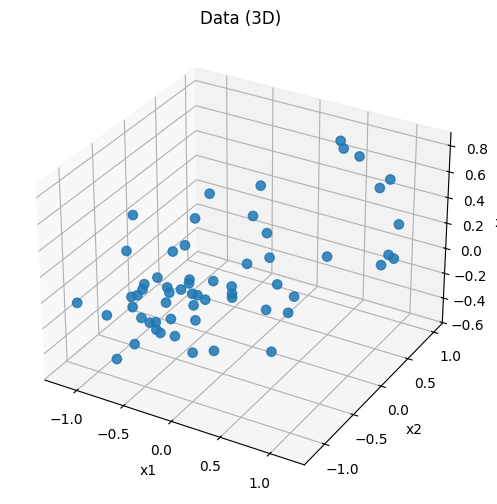

In [ ]:
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(X[:,0], X[:,1], X[:,2], s=45, alpha=0.85)

ax.set_title("Data (3D)")
ax.set_xlabel("x1"); ax.set_ylabel("x2"); ax.set_zlabel("x3")
plt.show()

In [ ]:
X

array([[-0.47562927, -1.18002627, -0.18665138],
       [-0.32908278,  0.18101846, -0.32767249],
       [ 1.1241412 ,  0.33792292,  0.15481443],
       [ 0.28072425, -0.21472162,  0.43963185],
       [-0.59903727, -0.94120105,  0.06412454],
       [-0.19688428, -0.59920621,  0.01191996],
       [-0.49635908, -1.18078845,  0.17385141],
       [ 0.57308241,  0.89868775,  0.66600244],
       [ 0.59410487, -0.55817151,  0.2549555 ],
       [ 1.17064931,  0.37224377,  0.80362823],
       [-1.1730746 , -1.04622548, -0.08061077],
       [-0.60011541, -0.3620432 , -0.50511579],
       [ 0.4963413 ,  0.74149446,  0.76848193],
       [-0.39977922, -0.95243354, -0.15466053],
       [-0.35448133, -0.44161974, -0.07728984],
       [-0.42846627, -0.63087978,  0.31216388],
       [-0.48357266, -0.92949165, -0.12834249],
       [-0.30000318, -0.94201494,  0.07449738],
       [-0.14919128, -0.76135868, -0.35919894],
       [-0.42432217, -0.85484973, -0.22736351],
       [ 0.29610766, -0.47325168,  0.672

In [ ]:
#mean
x_mean=X.mean(axis=0)
print(x_mean)

[-0.10328253 -0.37998889  0.08555963]


In [ ]:
-0.47562927-(-0.10328253)

-0.37234674

In [ ]:
#centerd data
x_center=X-x_mean
print(x_center)

[[-0.37234673 -0.80003737 -0.27221101]
 [-0.22580025  0.56100735 -0.41323212]
 [ 1.22742374  0.71791181  0.0692548 ]
 [ 0.38400679  0.16526728  0.35407222]
 [-0.49575473 -0.56121216 -0.02143509]
 [-0.09360174 -0.21921732 -0.07363967]
 [-0.39307654 -0.80079956  0.08829178]
 [ 0.67636494  1.27867664  0.58044281]
 [ 0.69738741 -0.17818262  0.16939587]
 [ 1.27393184  0.75223267  0.7180686 ]
 [-1.06979206 -0.66623658 -0.1661704 ]
 [-0.49683287  0.01794569 -0.59067542]
 [ 0.59962384  1.12148335  0.6829223 ]
 [-0.29649668 -0.57244465 -0.24022016]
 [-0.2511988  -0.06163085 -0.16284947]
 [-0.32518373 -0.25089089  0.22660425]
 [-0.38029013 -0.54950276 -0.21390212]
 [-0.19672065 -0.56202605 -0.01106225]
 [-0.04590875 -0.38136979 -0.44475856]
 [-0.32103964 -0.47486084 -0.31292314]
 [ 0.39939019 -0.09326279  0.58684643]
 [-0.40200355 -0.23263509 -0.07553453]
 [-0.69958904 -0.74188839 -0.14800225]
 [ 0.258056    0.03960872  0.14194763]
 [ 0.12022078 -0.67830152  0.25411778]
 [ 1.04636468  1.37734748

In [ ]:
x_center.mean(axis=0)  # texmini sifira yaxin olmalidir

array([-1.48029737e-17, -4.44089210e-17, -1.66533454e-17])

In [ ]:
# covariance matrix
cov_mat = np.cov(x_center, rowvar=False)
print("Covariance matrix:\n", cov_mat)

Covariance matrix:
 [[0.33894908 0.22596424 0.07588059]
 [0.22596424 0.35180308 0.08367381]
 [0.07588059 0.08367381 0.09689965]]


In [ ]:
# eigen decomposition
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print("Eigenvalues:\n", eig_vals)
print("Eigenvectors:\n", eig_vecs)

Eigenvalues:
 [0.59692012 0.11962006 0.07111164]
Eigenvectors:
 [[ 0.67857588  0.72817329 -0.09642839]
 [ 0.70073508 -0.6811147  -0.21225719]
 [ 0.22023881 -0.07646185  0.97244458]]


In [ ]:
total_variance = np.sum(eig_vals)
explained_ratio_manual = eig_vals / total_variance
print("Explained variance ratio (manual):\n", explained_ratio_manual)

Explained variance ratio (manual):
 [0.7578477  0.15186921 0.09028309]


In [ ]:
pca=PCA(n_components=3)
pca.fit(x_center)

PCA(n_components=3)

In [ ]:
pca.explained_variance_

array([0.59692012, 0.11962006, 0.07111164])

In [ ]:
pca.explained_variance_ratio_

array([0.7578477 , 0.15186921, 0.09028309])

In [ ]:
pca.components_

array([[ 0.67857588,  0.70073508,  0.22023881],
       [ 0.72817329, -0.6811147 , -0.07646185],
       [-0.09642839, -0.21225719,  0.97244458]])

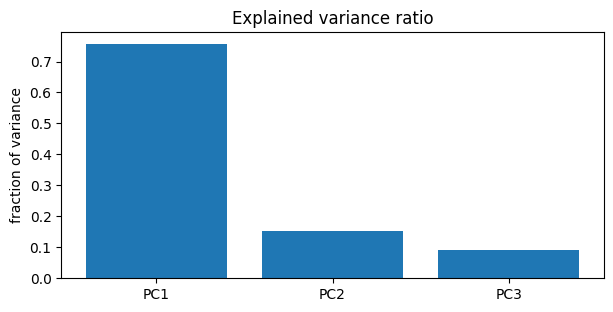

In [ ]:
plt.figure(figsize=(7,3.2))
plt.bar([1,2,3], pca.explained_variance_ratio_)
plt.xticks([1,2,3], ["PC1","PC2","PC3"])
plt.title("Explained variance ratio")
plt.ylabel("fraction of variance")
plt.show()

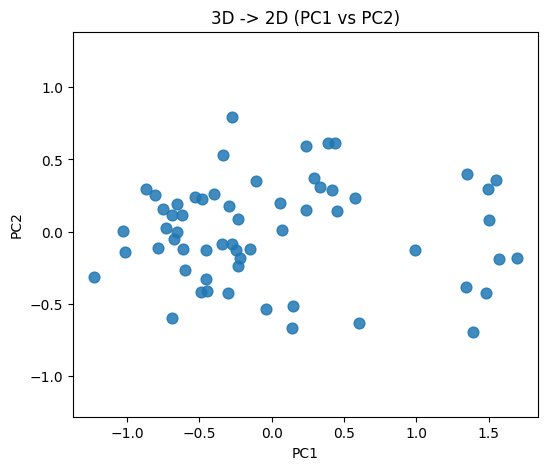

In [ ]:
Z2 = PCA(n_components=2).fit_transform(x_center)


plt.figure(figsize=(6,5))
plt.scatter(Z2[:,0], Z2[:,1], s=60, alpha=0.85)
plt.title("3D -> 2D (PC1 vs PC2)")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.axis("equal")
plt.show()

Z1 shape = (60, 1)


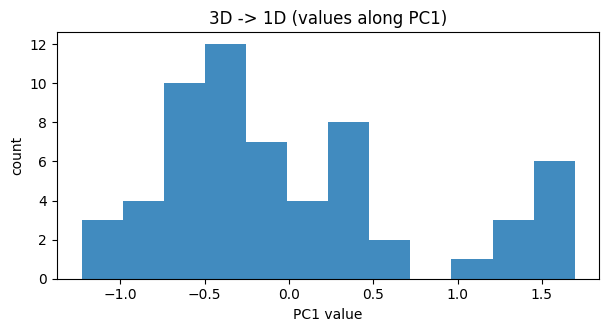

In [ ]:
pca1 = PCA(n_components=1).fit(x_center)
Z1 = pca1.transform(x_center)   # (m,1)

print("Z1 shape =", Z1.shape)

plt.figure(figsize=(7,3.2))
plt.hist(Z1[:,0], bins=12, alpha=0.85)
plt.title("3D -> 1D (values along PC1)")
plt.xlabel("PC1 value"); plt.ylabel("count")
plt.show()

In [ ]:
Xhat1 = pca1.inverse_transform(Z1)  # centered space-də geri yığdıq

mse1 = np.mean((x_center - Xhat1)**2)
print("Reconstruction MSE (1 PC) =", mse1)

Reconstruction MSE (1 PC) = 0.06251761308873767


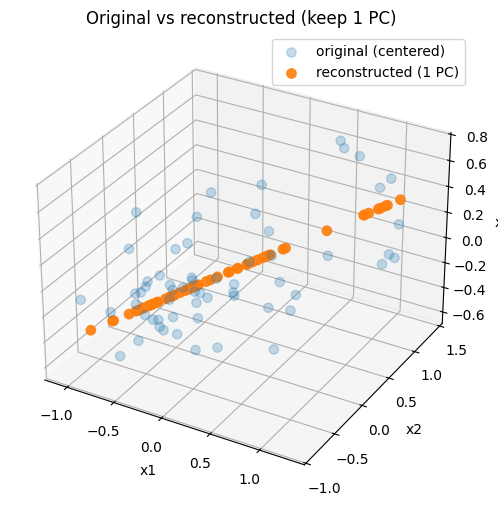

In [ ]:
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection="3d")

ax.scatter(x_center[:,0], x_center[:,1], x_center[:,2], s=45, alpha=0.25, label="original (centered)")
ax.scatter(Xhat1[:,0], Xhat1[:,1], Xhat1[:,2], s=45, alpha=0.9, label="reconstructed (1 PC)")

ax.set_title("Original vs reconstructed (keep 1 PC)")
ax.set_xlabel("x1"); ax.set_ylabel("x2"); ax.set_zlabel("x3")
ax.legend()
plt.show()

In [ ]:
pca2 = PCA(n_components=2).fit(x_center)
Z2 = pca2.transform(x_center)
Xhat2 = pca2.inverse_transform(Z2)

mse2 = np.mean((x_center - Xhat2)**2)
print("Reconstruction MSE (2 PCs) =", mse2)

Reconstruction MSE (2 PCs) = 0.02330881613289282


In [ ]:
Xhat2.shape

(60, 3)

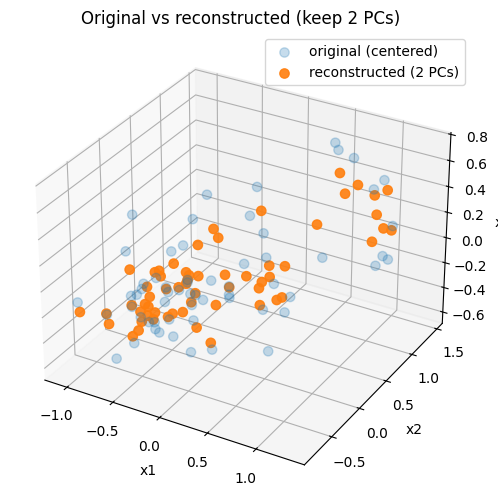

In [ ]:
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection="3d")

ax.scatter(x_center[:,0], x_center[:,1], x_center[:,2], s=45, alpha=0.25, label="original (centered)")
ax.scatter(Xhat2[:,0], Xhat2[:,1], Xhat2[:,2], s=45, alpha=0.9, label="reconstructed (2 PCs)")

ax.set_title("Original vs reconstructed (keep 2 PCs)")
ax.set_xlabel("x1"); ax.set_ylabel("x2"); ax.set_zlabel("x3")
ax.legend()
plt.show()

In [ ]:
data = fetch_olivetti_faces(shuffle=True, random_state=42)
images = data.images
X = data.data
n, d = X.shape


downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


In [ ]:
images.shape

(400, 64, 64)

In [ ]:
X.shape

(400, 4096)

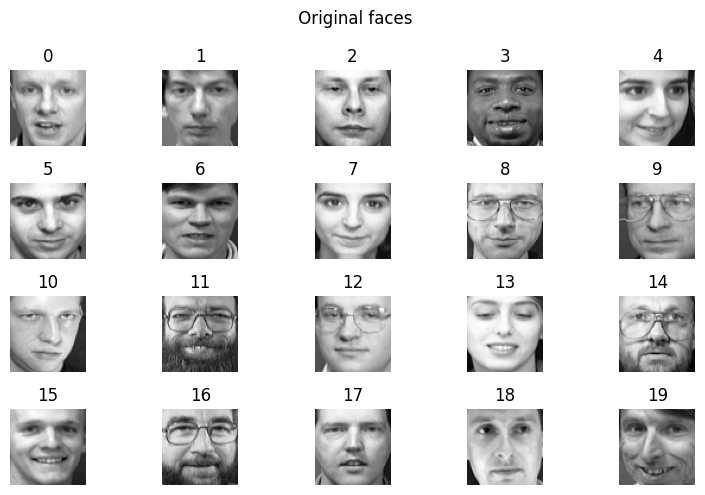

In [ ]:
plt.figure(figsize=(8, 5))
for i in range(20):
    ax = plt.subplot(4, 5, i+1)
    ax.imshow(images[i], cmap="gray")
    ax.set_title(f"{i}")
    ax.axis("off")
plt.suptitle(" Original faces")
plt.tight_layout()
plt.show()

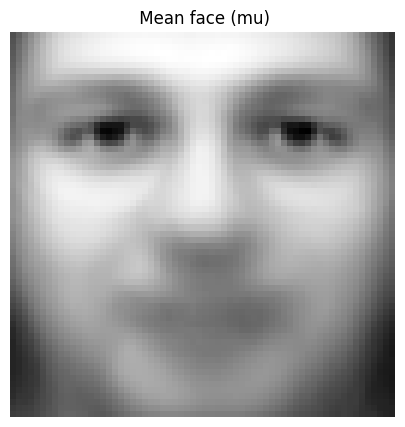

In [ ]:
mu = X.mean(axis=0)
Xc = X - mu



plt.figure(figsize=(6, 5))
plt.imshow(mu.reshape(64, 64), cmap="gray")
plt.title(" Mean face (mu)")
plt.axis("off")
plt.show()

In [ ]:
pca = PCA(n_components=256,  random_state=42)
pca.fit(X)

eigvals = pca.explained_variance_
ratio = pca.explained_variance_ratio_
W = pca.components_
mean_ = pca.mean_



In [ ]:
eigvals

array([1.88401833e+01, 1.10717602e+01, 6.30460978e+00, 3.95458269e+00,
       2.85604334e+00, 2.49771023e+00, 1.92006290e+00, 1.61116028e+00,
       1.54922235e+00, 1.32295012e+00, 1.26210952e+00, 1.13691020e+00,
       9.86397743e-01, 9.07589734e-01, 8.40928257e-01, 7.73553848e-01,
       7.27142870e-01, 6.45266116e-01, 5.96451342e-01, 5.91000497e-01,
       5.52701473e-01, 4.86282259e-01, 4.61992800e-01, 4.50753659e-01,
       4.32136029e-01, 4.20793831e-01, 4.06521380e-01, 3.92300129e-01,
       3.62095147e-01, 3.49055827e-01, 3.18055987e-01, 3.03963810e-01,
       2.86368579e-01, 2.64683723e-01, 2.53479123e-01, 2.50045568e-01,
       2.41426855e-01, 2.36274123e-01, 2.23224580e-01, 2.16788679e-01,
       2.05526710e-01, 2.00952381e-01, 1.93481058e-01, 1.89756498e-01,
       1.82676151e-01, 1.79138511e-01, 1.75868705e-01, 1.74410313e-01,
       1.65294260e-01, 1.62178710e-01, 1.55738443e-01, 1.51460513e-01,
       1.46404877e-01, 1.41573116e-01, 1.40520200e-01, 1.36465162e-01,
      

In [ ]:
W

array([[ 0.00419111,  0.00710949,  0.0093361 , ..., -0.00018516,
        -0.00337966, -0.00318826],
       [ 0.02859144,  0.03328843,  0.03784647, ..., -0.02962783,
        -0.02721299, -0.02488899],
       [ 0.00135689, -0.0003258 , -0.00019804, ..., -0.01541362,
        -0.01370976, -0.01188339],
       ...,
       [-0.01015816,  0.0024169 ,  0.01366562, ..., -0.01258787,
         0.00349062,  0.02839928],
       [-0.01703755, -0.00180751,  0.00859618, ..., -0.00596721,
         0.00495426,  0.03677196],
       [-0.00771686, -0.03524124, -0.0148614 , ...,  0.07116745,
         0.04622178, -0.04904148]], dtype=float32)

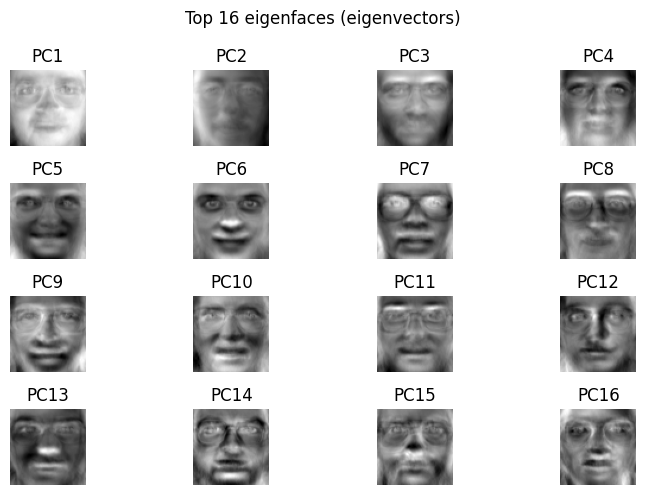

In [ ]:
top_k = 16
plt.figure(figsize=(8, 5))
for i in range(top_k):
    ax = plt.subplot(4, 4, i+1)
    ax.imshow(W[i].reshape(64, 64), cmap="gray")
    ax.set_title(f"PC{i+1}")
    ax.axis("off")
plt.suptitle("Top 16 eigenfaces (eigenvectors)")
plt.tight_layout()
plt.show()

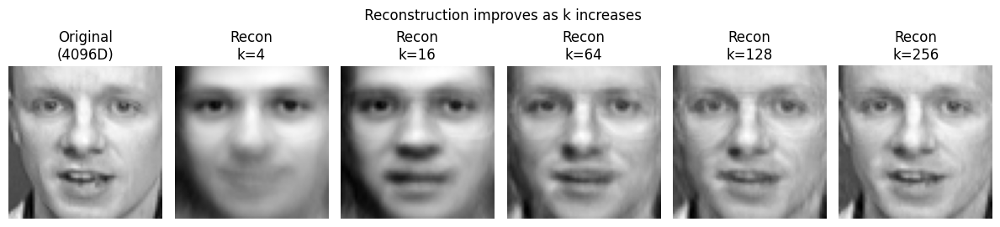

In [ ]:
idx = 0
x = X[idx:idx+1]
x_center = x - mean_

ks = [4, 16, 64, 128, 256]
recons = []

for k in ks:
    Wk = W[:k]
    z = x_center @ Wk.T
    x_hat = z @ Wk + mean_
    recons.append(x_hat.reshape(64, 64))


plt.figure(figsize=(12, 3))
ax = plt.subplot(1, len(ks)+1, 1)
ax.imshow(x.reshape(64, 64), cmap="gray")
ax.set_title("Original\n(4096D)")
ax.axis("off")

for i, (k, img_hat) in enumerate(zip(ks, recons), start=2):
    ax = plt.subplot(1, len(ks)+1, i)
    ax.imshow(img_hat, cmap="gray")
    ax.set_title(f"Recon\nk={k}")
    ax.axis("off")

plt.suptitle(" Reconstruction improves as k increases")
plt.tight_layout()
plt.show()

#Kmeans

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import pandas as pd


In [ ]:
X, y_true = make_blobs(
    n_samples=500,
    centers=4,
    cluster_std=0.8,
    random_state=42
)

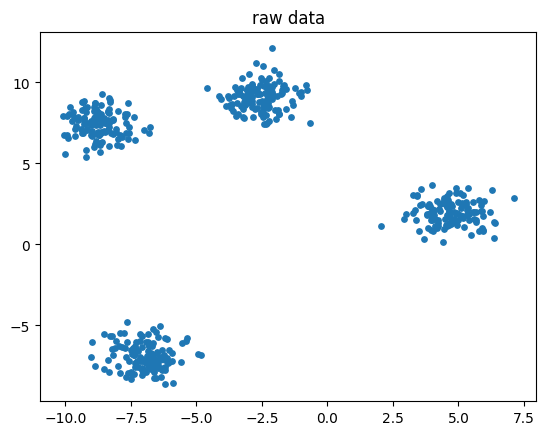

In [ ]:
plt.scatter(X[:,0], X[:,1], s=15)
plt.title('raw data')
plt.show()

In [ ]:
X.shape

(500, 2)

In [ ]:
np.unique(y_true)

array([0, 1, 2, 3])

In [ ]:
k=4
kmeans=KMeans(
    n_clusters=k,
    init='k-means++',
    n_init=10,
    random_state=42

)

In [ ]:
labesls=kmeans.fit_predict(X)

In [ ]:
labesls is kmeans.labels_

True

In [ ]:
centers=kmeans.cluster_centers_
centers

array([[ 4.70543542,  1.93371842],
       [-8.71289556,  7.42906626],
       [-6.97669736, -6.89958795],
       [-2.58361185,  9.07680526]])

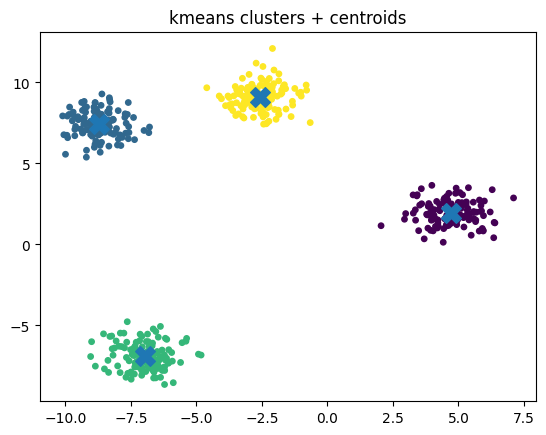

In [ ]:
plt.scatter(X[:,0], X[:,1], c=labesls, s=15)
plt.scatter(centers[:,0], centers[:,1], s=200, marker='X')
plt.title('kmeans clusters + centroids')
plt.show()

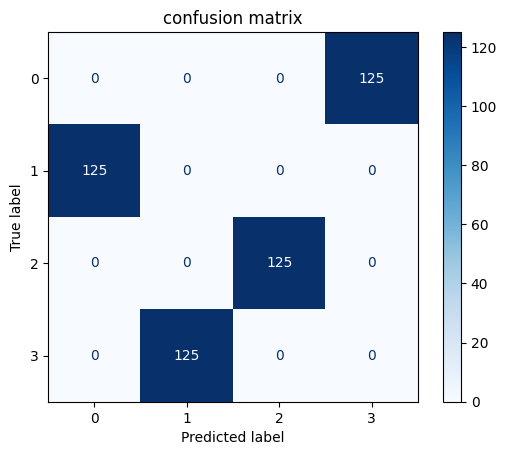

In [ ]:
cm=confusion_matrix(y_true, labesls)
disp=ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title('confusion matrix')
plt.show()

In [ ]:
kmeans.inertia_

607.2898197360992

In [ ]:
kmeans.score(X)

-607.2898197360993

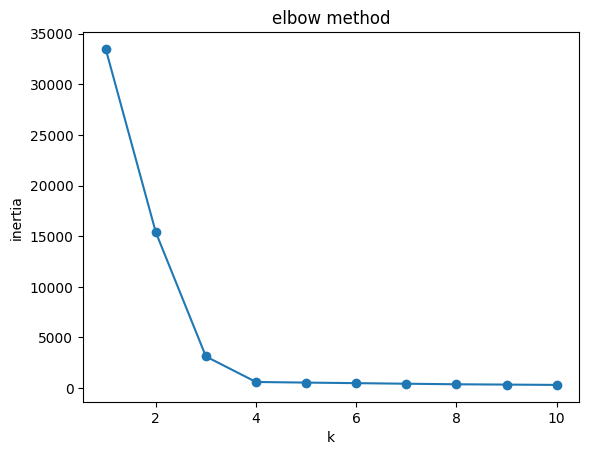

In [ ]:
inertia=[]
for i in range(1,11):
  km=KMeans(
      n_clusters=i,
      init='k-means++',
      n_init=10,
      random_state=42
      )
  km.fit(X)
  inertia.append(km.inertia_)
plt.plot(list(range(1,11)), inertia, marker='o')
plt.xlabel('k')
plt.ylabel('inertia')
plt.title('elbow method')
plt.show()

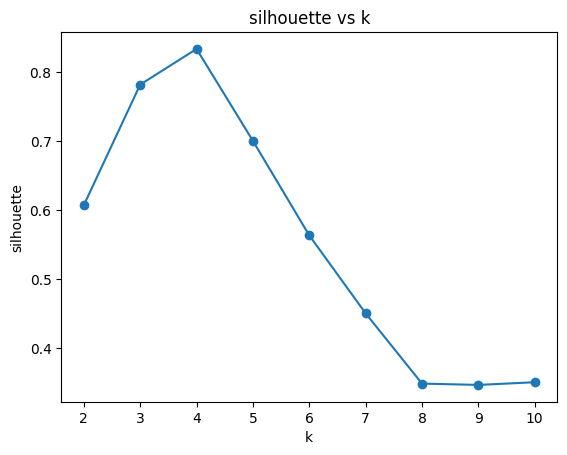

In [ ]:
sil=[]
for i in range(2,11):
  km=KMeans(
      n_clusters=i,
      init='k-means++',
      n_init=10,
      random_state=42
      )
  labels=km.fit_predict(X)
  sil.append(silhouette_score(X, labels))
plt.plot(list(range(2,11)), sil, marker='o')
plt.xlabel('k')
plt.ylabel('silhouette')
plt.title('silhouette vs k')
plt.show()

In [ ]:
! curl -L -o mnist-in-csv.zip\
  https://www.kaggle.com/api/v1/datasets/download/oddrationale/mnist-in-csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 15.2M  100 15.2M    0     0  32.2M      0 --:--:-- --:--:-- --:--:-- 32.2M


In [ ]:
!unzip /content/mnist-in-csv.zip

Archive:  /content/mnist-in-csv.zip
  inflating: mnist_test.csv          
  inflating: mnist_train.csv         


In [ ]:
df=pd.read_csv('/content/mnist_train.csv').reset_index(drop=True)

In [ ]:
df

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59997,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
y_true = df["label"].to_numpy()
X = df.drop(columns=["label"]).to_numpy(dtype=np.float32)
X = X / 255.0

In [ ]:
X.shape

(60000, 784)

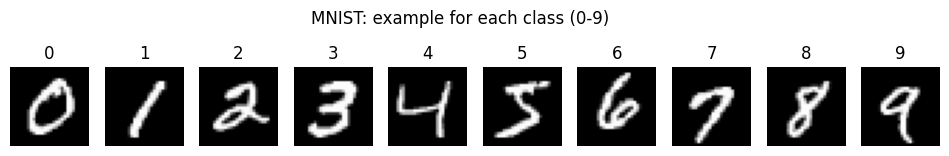

In [ ]:
sample_idx = {}
for d in range(10):
    sample_idx[d] = int(np.where(y_true == d)[0][0])

plt.figure(figsize=(12, 2))
for d in range(10):
    idx = sample_idx[d]
    img = X[idx].reshape(28, 28)

    plt.subplot(1, 10, d + 1)
    plt.imshow(img, cmap="gray")
    plt.title(str(d))
    plt.axis("off")

plt.suptitle("MNIST: example for each class (0-9)")
plt.show()

In [ ]:
pca = PCA(n_components=784, random_state=42)
X_pca = pca.fit_transform(X)

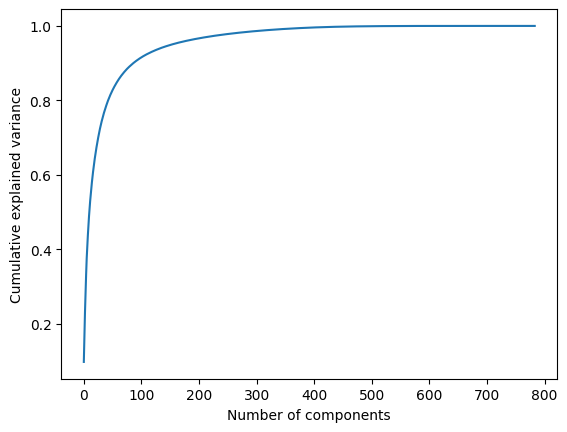

In [ ]:
pca = PCA().fit(X)

import numpy as np

cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

import matplotlib.pyplot as plt
plt.plot(cumulative_variance)
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.show()

In [ ]:
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X)
print(X_pca.shape)

(60000, 154)


In [ ]:
km = KMeans(n_clusters=10, init="k-means++", n_init=20, random_state=42)
cluster_id = km.fit_predict(X_pca)

In [ ]:
cluster_to_digit = {}
for c in range(10):
    mask = (cluster_id == c)
    digit = np.bincount(y_true[mask]).argmax()
    cluster_to_digit[c] = digit

cluster_to_digit

{0: np.int64(4),
 1: np.int64(1),
 2: np.int64(3),
 3: np.int64(1),
 4: np.int64(7),
 5: np.int64(8),
 6: np.int64(2),
 7: np.int64(0),
 8: np.int64(0),
 9: np.int64(6)}

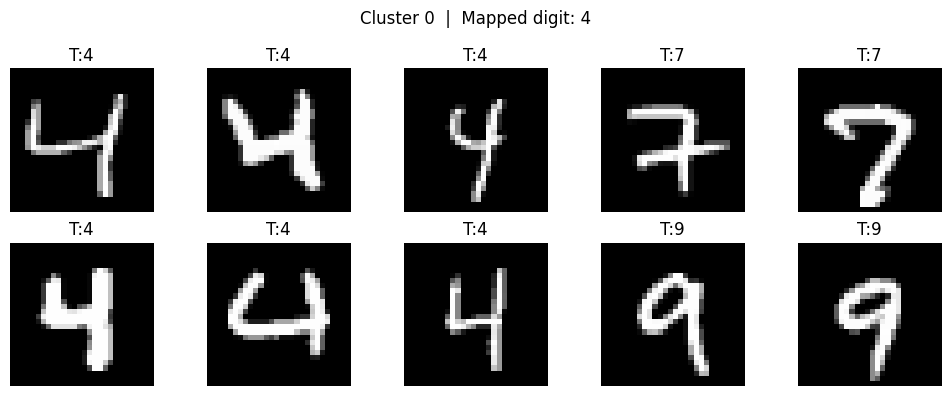

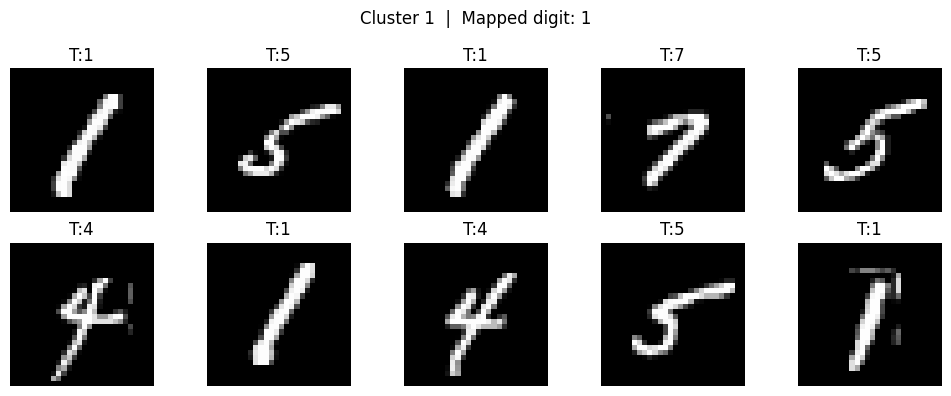

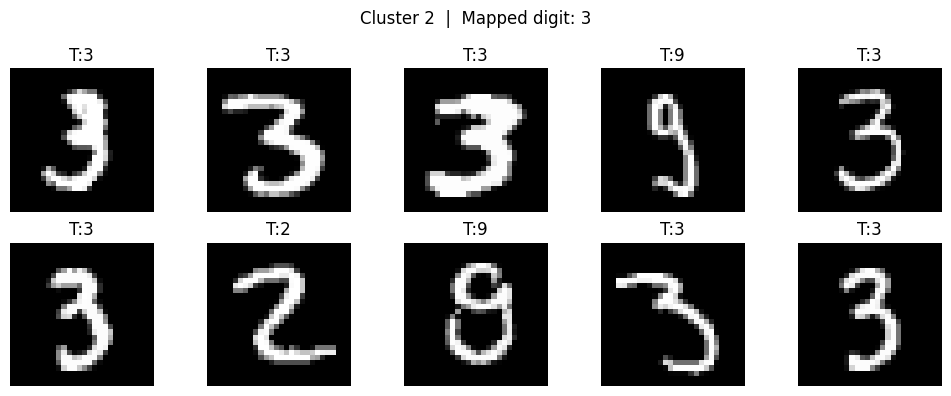

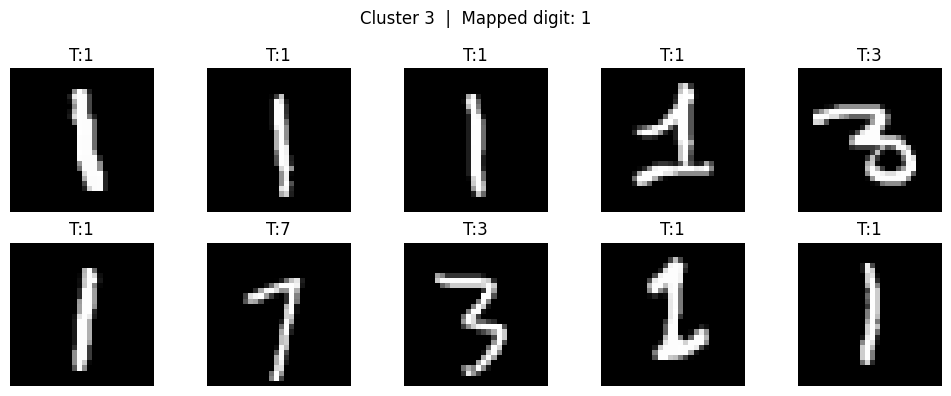

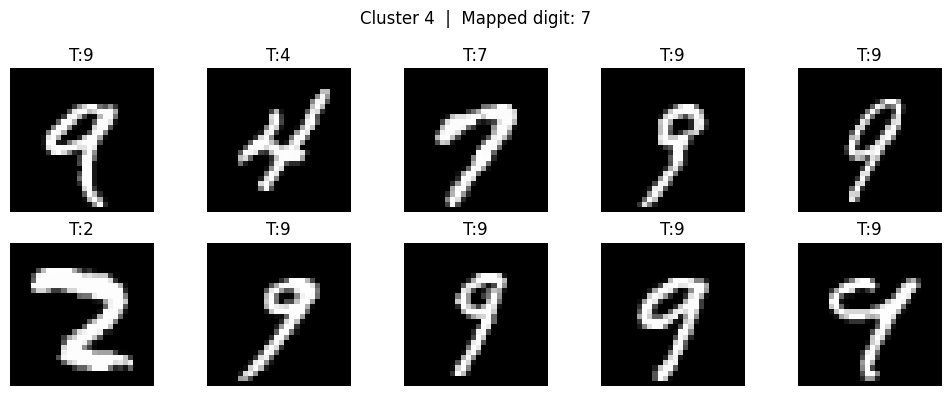

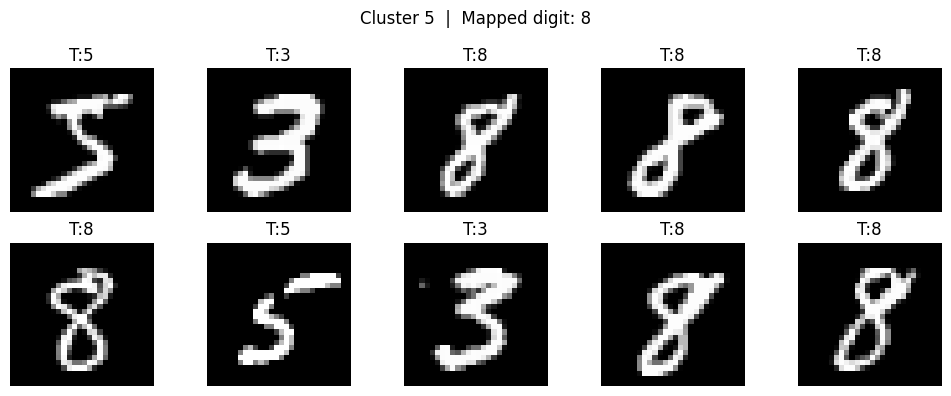

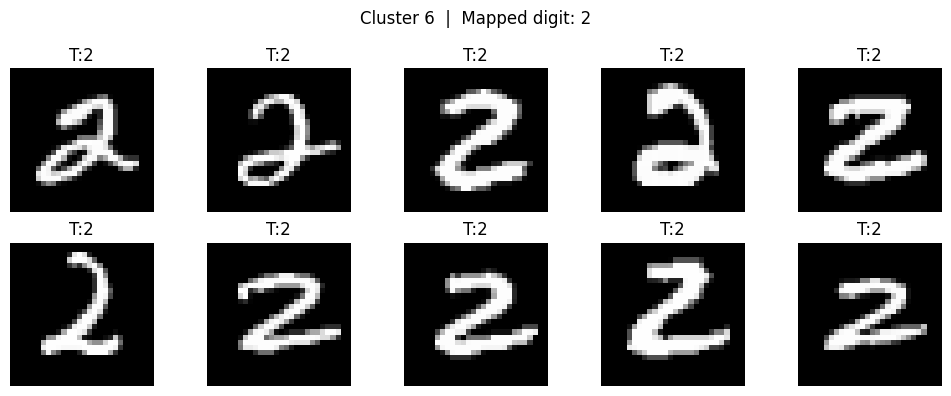

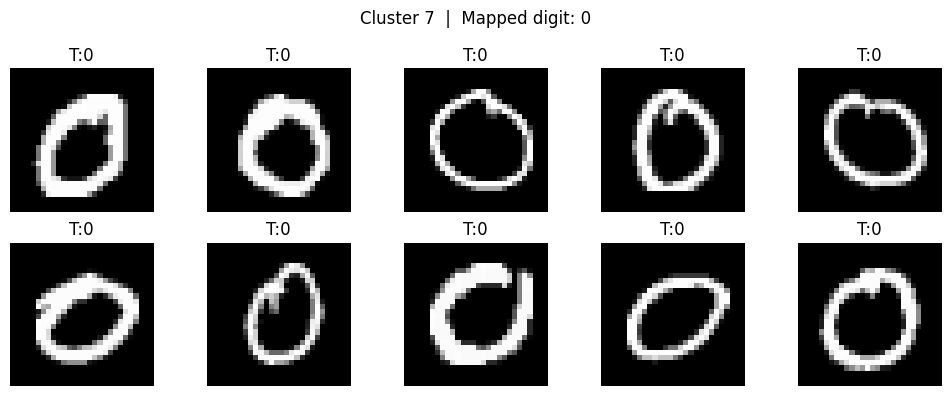

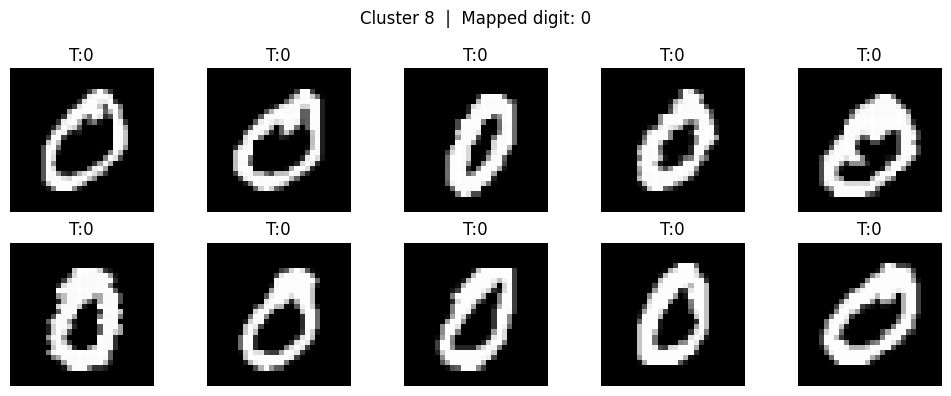

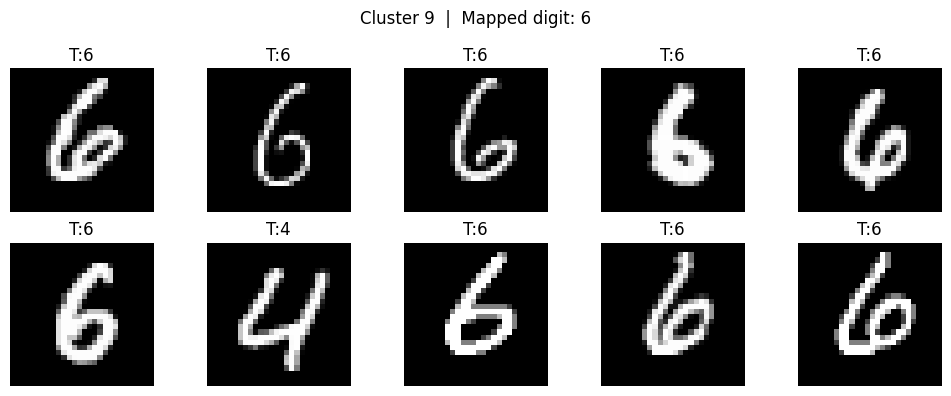

In [ ]:
def show_cluster(cluster_num, n=10):
    indices = np.where(cluster_id == cluster_num)[0][:n]

    plt.figure(figsize=(10, 4))

    for i, idx in enumerate(indices):
        img = X[idx].reshape(28, 28)
        true_label = y_true[idx]
        mapped_digit = cluster_to_digit[cluster_num]

        plt.subplot(2, 5, i+1)
        plt.imshow(img, cmap="gray")
        plt.title(f"T:{true_label}")
        plt.axis("off")

    plt.suptitle(f"Cluster {cluster_num}  |  Mapped digit: {mapped_digit}")
    plt.tight_layout()
    plt.show()
for c in range(10):
    show_cluster(c)

In [ ]:
idx = 121
pred_digit = cluster_to_digit[cluster_id[idx]]
print("True digit:", y_true[idx], "Pred digit:", pred_digit, "Cluster:", cluster_id[idx])

True digit: 0 Pred digit: 0 Cluster: 7


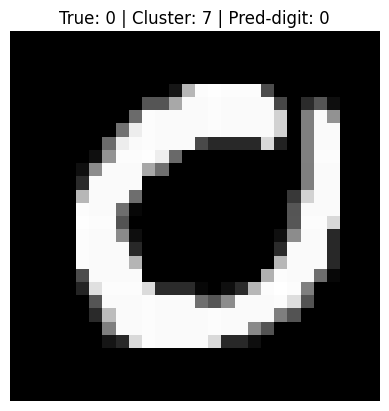

In [ ]:
idx = 121
image = X[idx].reshape(28, 28)

pred_digit = cluster_to_digit[cluster_id[idx]]

plt.imshow(image, cmap="gray")
plt.title(f"True: {y_true[idx]} | Cluster: {cluster_id[idx]} | Pred-digit: {pred_digit}")
plt.axis("off")
plt.show()

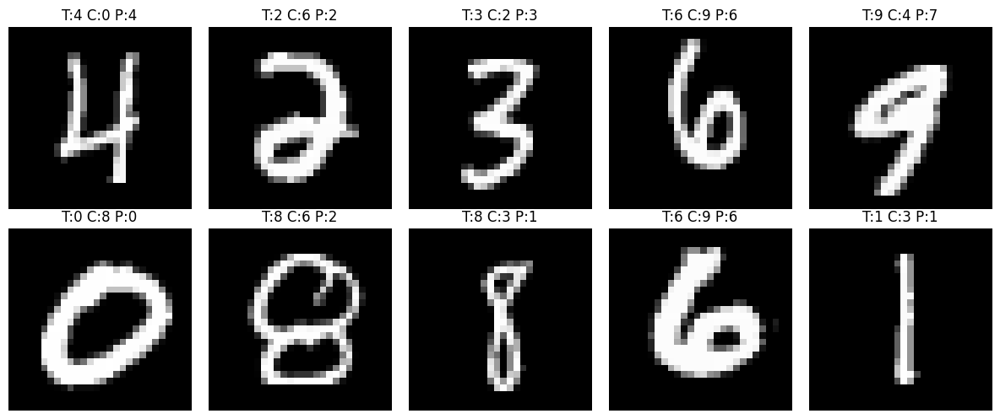

In [ ]:
indices = np.random.choice(len(X), 10, replace=False)

plt.figure(figsize=(12, 5))

for i, idx in enumerate(indices):
    image = X[idx].reshape(28, 28)
    pred_digit = cluster_to_digit[cluster_id[idx]]

    plt.subplot(2, 5, i+1)
    plt.imshow(image, cmap="gray")
    plt.title(f"T:{y_true[idx]} C:{cluster_id[idx]} P:{pred_digit}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
!pip install pillow

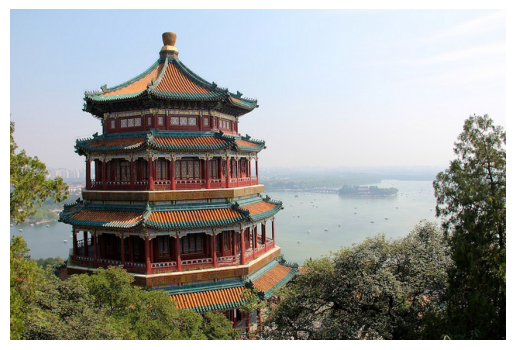

In [ ]:
from sklearn.datasets import load_sample_image
import matplotlib.pyplot as plt

image= load_sample_image("china.jpg")

plt.imshow(image)
plt.axis("off")
plt.show()

In [ ]:
image.shape

(427, 640, 3)

In [ ]:
X = image.reshape(-1, 3)
kmeans = KMeans(n_clusters=8, random_state=42).fit(X)
segmented_img = kmeans.cluster_centers_[kmeans.labels_]
segmented_img = segmented_img.reshape(image.shape)
segmented_img = np.clip(segmented_img, 0, 255).astype(np.uint8)

In [ ]:
X

array([[174, 201, 231],
       [174, 201, 231],
       [174, 201, 231],
       ...,
       [ 43,  49,  39],
       [ 13,  21,   6],
       [ 15,  24,   7]], dtype=uint8)

array([[[198, 215, 233],
        [198, 215, 233],
        [198, 215, 233],
        ...,
        [234, 240, 249],
        [234, 240, 249],
        [234, 240, 249]],

       [[198, 215, 233],
        [198, 215, 233],
        [198, 215, 233],
        ...,
        [234, 240, 249],
        [234, 240, 249],
        [234, 240, 249]],

       [[198, 215, 233],
        [198, 215, 233],
        [198, 215, 233],
        ...,
        [234, 240, 249],
        [234, 240, 249],
        [234, 240, 249]],

       ...,

       [[ 93,  83,  55],
        [126, 117,  89],
        [ 93,  83,  55],
        ...,
        [ 54,  48,  36],
        [ 20,  17,  11],
        [ 20,  17,  11]],

       [[ 93,  83,  55],
        [126, 117,  89],
        [ 93,  83,  55],
        ...,
        [ 20,  17,  11],
        [ 20,  17,  11],
        [ 20,  17,  11]],

       [[ 93,  83,  55],
        [ 93,  83,  55],
        [ 93,  83,  55],
        ...,
        [ 54,  48,  36],
        [ 20,  17,  11],
        [ 20,  17,  11]]], dtype=uint8)
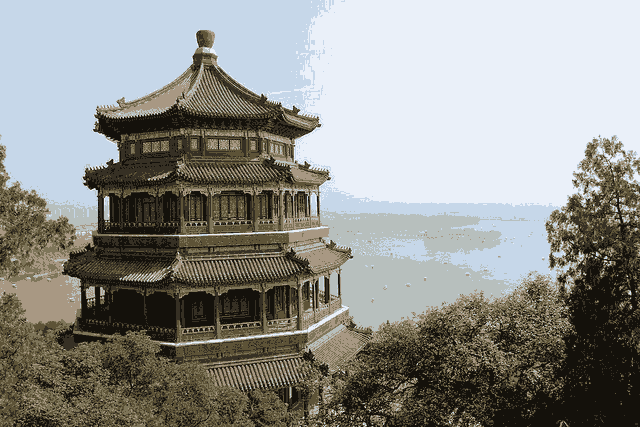

In [ ]:
segmented_img

In [ ]:
kmeans.cluster_centers_

array([[210.132136  , 217.94503438, 225.45345423],
       [ 72.17088569,  65.08531936,  47.16120767]])

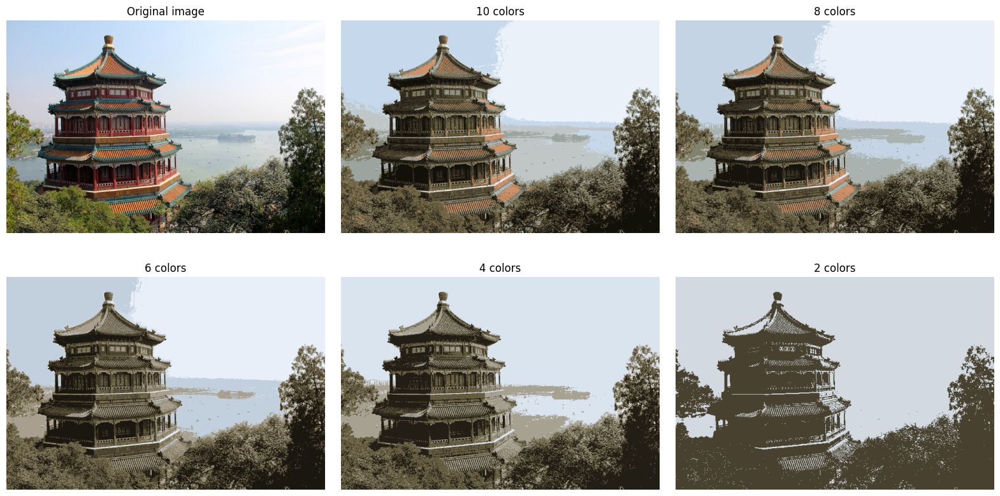

In [ ]:
segmented_imgs = []

n_colors = (10, 8, 6, 4, 2)
for n_clusters in n_colors:
  kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=42).fit(X)
  segmented_img = kmeans.cluster_centers_[kmeans.labels_]
  segmented_imgs.append(segmented_img.reshape(image.shape))

plt.figure(figsize=(20, 10))
plt.subplots_adjust(wspace = 0.05, hspace=0.1)

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title('Original image')
plt.axis('off')

for idx, n_clusters in enumerate(n_colors):
  plt.subplot(2, 3, 2 + idx)
  plt.imshow(segmented_imgs[idx] / 255)
  plt.title(f"{n_clusters} colors")
  plt.axis('off')

plt.show()

#Using Clustering for Semi-Supervised Learning

In [ ]:
from sklearn.datasets import load_digits
X_digits, y_digits = load_digits(return_X_y=True)
X_train, y_train = X_digits[:1400], y_digits[:1400]
X_test, y_test = X_digits[1400:], y_digits[1400:]

In [ ]:
from sklearn.linear_model import LogisticRegression
n_labeled = 50
log_reg = LogisticRegression(max_iter=10_000)
log_reg.fit(X_train[:n_labeled], y_train[:n_labeled])

LogisticRegression(max_iter=10000)

In [ ]:
log_reg.score(X_test, y_test)

0.7581863979848866

In [ ]:

k = 50
kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
X_digits_dist = kmeans.fit_transform(X_train)           # fit edende mesafeleri yoxlayir
representative_digit_idx = X_digits_dist.argmin(axis=0) # en az mesafe olan 50 merkeze yaxin noqteni gosterir
X_representative_digits = X_train[representative_digit_idx]

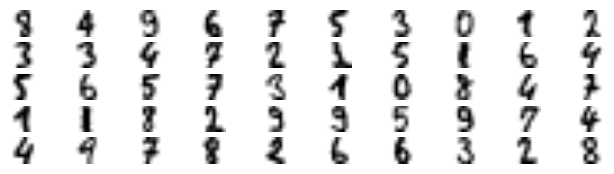

In [ ]:
plt.figure(figsize=(8, 2))
for index, X_representative_digit in enumerate(X_representative_digits):
  plt.subplot(k // 10, 10, index + 1)
  plt.imshow(X_representative_digit.reshape(8, 8), cmap="binary",
             interpolation='bilinear')
  plt.axis('off')

plt.show()

In [ ]:
X_representative_digit.reshape(8, 8).shape

(8, 8)

In [ ]:
y_representative_digits = np.array([
    8,4,9,6,7,5,3,0,1,2,
    3,3,4,7,2,1,5,1,6,4,
    5,6,5,7,3,1,0,8,4,7,
    1,1,8,2,9,9,5,9,7,4,
    4,9,7,8,2,6,6,3,2,8
])

In [ ]:
log_reg = LogisticRegression(max_iter=10_000)
log_reg.fit(X_representative_digits, y_representative_digits)
log_reg.score(X_test, y_test)

0.8387909319899244

In [ ]:

log_reg.score(X_train, y_train)

0.9364285714285714

In [ ]:
y_train_propagated = np.empty(len(X_train), dtype=np.int64)
for i in range(k):
  y_train_propagated[kmeans.labels_ == i] = y_representative_digits[i]

In [ ]:
y_representative_digits


array([8, 4, 9, 6, 7, 5, 3, 0, 1, 2, 3, 3, 4, 7, 2, 1, 5, 1, 6, 4, 5, 6,
       5, 7, 3, 1, 0, 8, 4, 7, 1, 1, 8, 2, 9, 9, 5, 9, 7, 4, 4, 9, 7, 8,
       2, 6, 6, 3, 2, 8])

In [ ]:

y_train_propagated

array([0, 1, 2, ..., 4, 4, 7])

In [ ]:
kmeans.labels_

array([ 7, 31, 44, ..., 40, 40, 23], dtype=int32)

In [ ]:
log_reg = LogisticRegression(max_iter=10_000)
log_reg.fit(X_train, y_train_propagated)

LogisticRegression(max_iter=10000)

In [ ]:

log_reg.score(X_test, y_test)

0.8589420654911839

In [ ]:

X_digits_dist

array([[39.2013243 , 51.61166593, 35.78092988, ..., 38.38114439,
        50.23366329, 39.12819457],
       [38.04484845, 32.68742517, 49.74639198, ..., 49.57935301,
        46.33618043, 40.98059968],
       [39.89248668, 41.45574598, 52.89107126, ..., 45.0884618 ,
        45.41881992, 38.78359351],
       ...,
       [47.70359228, 31.996892  , 53.95358402, ..., 51.32081966,
        58.66979688, 48.15773173],
       [46.20208562, 31.35143073, 53.34513581, ..., 51.42509909,
        58.40766568, 47.54535798],
       [35.79679446, 44.83906598, 47.16070489, ..., 47.4428765 ,
        54.8295814 , 39.67310178]])

In [ ]:
percentile_closest = 99

X_cluster_dist = X_digits_dist[np.arange(len(X_train)), kmeans.labels_]
for i in range(k):
  in_cluster = (kmeans.labels_ == i)
  cluster_dist = X_cluster_dist[in_cluster]
  cutoff_distance = np.percentile(cluster_dist, percentile_closest)
  above_cutoff = (X_cluster_dist > cutoff_distance)
  X_cluster_dist[in_cluster & above_cutoff] = -1

partially_propagated = (X_cluster_dist != -1)
X_train_partially_propagated = X_train[partially_propagated]
y_train_partially_propagated = y_train_propagated[partially_propagated]

In [ ]:

log_reg = LogisticRegression(max_iter=10_000)
log_reg.fit(X_train_partially_propagated, y_train_partially_propagated)
log_reg.score(X_test, y_test)

0.8564231738035264

In [ ]:
(y_train_partially_propagated == y_train[partially_propagated]).mean()

np.float64(0.9548148148148148)

#DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
X, y = make_moons(
    n_samples=1000,
    noise=0.05,
    random_state=42)

dbscan = DBSCAN(eps=0.05, min_samples=5)
dbscan.fit(X)

DBSCAN(eps=0.05)

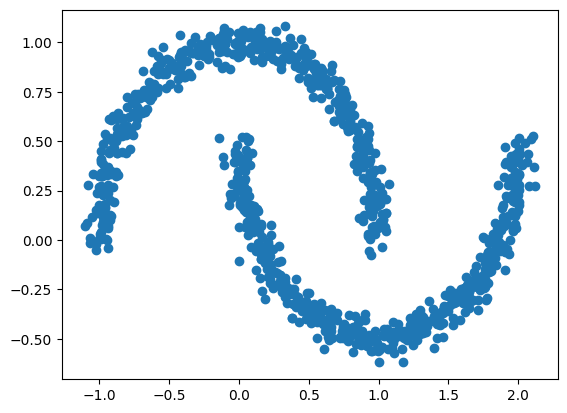

In [ ]:
plt.scatter(X[:,0], X[:,1])
plt.show()

In [ ]:
labels=dbscan.labels_
labels

array([ 0,  2, -1, -1,  1,  0,  0,  0,  2,  5,  2,  3,  0,  2,  2,  2,  4,
        2,  2,  4,  0,  5,  1,  0,  5,  5,  3,  2,  2,  2,  4,  5,  0,  6,
        1, -1,  0,  0,  2,  3, -1,  3,  4, -1,  4,  4,  2,  0,  6,  2,  0,
        2,  4,  0,  3,  3,  0,  3,  5,  2, -1,  3,  0,  5,  0,  0,  0,  2,
        3,  0,  3,  6,  0,  2,  4,  4,  0,  3,  0,  4,  0,  3, -1,  3,  4,
        0, -1,  2,  2,  4,  1,  6,  0,  5,  2,  6,  2,  3,  3, -1,  2, -1,
        2,  4,  0,  0,  0,  2,  5,  2,  0,  2, -1,  2,  3,  1,  5,  2,  0,
        4,  2,  1,  2,  4,  4,  0,  0,  6,  2,  2,  0,  2, -1,  2,  0,  3,
        3,  5, -1,  3,  3,  5,  2,  4,  2,  2,  2,  4,  2,  4,  0, -1,  2,
        1,  2,  6,  4,  2,  3,  2, -1,  2,  0,  0,  2,  0,  4,  0,  4,  4,
        1,  6,  3,  2,  6,  1,  4,  4,  2,  0,  6,  0,  1,  0,  2,  5,  1,
        1,  2,  2,  2,  2,  0,  5,  5,  1,  4,  5,  0,  3,  3,  0,  0,  0,
        2,  0,  5,  2, -1,  2,  3,  5,  2,  2,  0,  4,  0,  4,  2,  2,  4,
        2,  2,  3,  2,  3

In [ ]:
dbscan.core_sample_indices_

array([  0,   4,   5,   6,   7,   8,  10,  11,  12,  13,  14,  16,  17,
        18,  19,  20,  21,  22,  23,  24,  25,  26,  28,  29,  30,  31,
        32,  33,  34,  36,  38,  39,  41,  42,  44,  45,  47,  49,  50,
        51,  52,  53,  54,  55,  56,  58,  59,  61,  63,  64,  65,  66,
        67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,
        80,  81,  83,  84,  85,  87,  88,  89,  90,  91,  93,  94,  96,
        97,  98, 102, 103, 104, 105, 106, 107, 108, 109, 110, 113, 114,
       115, 116, 117, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 135, 136, 139, 140, 141, 143, 144, 145, 146, 147, 148, 149,
       150, 152, 153, 154, 155, 156, 157, 158, 159, 161, 162, 163, 164,
       165, 166, 167, 168, 169, 170, 172, 173, 174, 175, 176, 177, 178,
       179, 181, 182, 183, 185, 186, 187, 188, 189, 191, 193, 194, 195,
       196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 209, 210,
       211, 212, 213, 214, 215, 216, 217, 218, 219, 221, 222, 22

In [ ]:
dbscan.components_

array([[-0.02137124,  0.40618608],
       [-0.84192557,  0.53058695],
       [ 0.58930337, -0.32137599],
       ...,
       [ 1.66258462, -0.3079193 ],
       [-0.94355873,  0.3278936 ],
       [ 0.79419406,  0.60777171]])

In [ ]:
np.unique(labels) # -1 varsa noise var

array([-1,  0,  1,  2,  3,  4,  5,  6])

In [ ]:
dbscan.core_sample_indices_[:10]

array([ 0,  4,  5,  6,  7,  8, 10, 11, 12, 13])

In [ ]:
len(dbscan.core_sample_indices_)

808

In [ ]:
dbscan.components_.shape

(808, 2)

In [ ]:
for eps in [0.02, 0.05, 0.1, 0.2]:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(X)
    print(f"eps={eps}, clusters={len(set(labels)) - (1 if -1 in labels else 0)}")

eps=0.02, clusters=16
eps=0.05, clusters=7
eps=0.1, clusters=2
eps=0.2, clusters=2


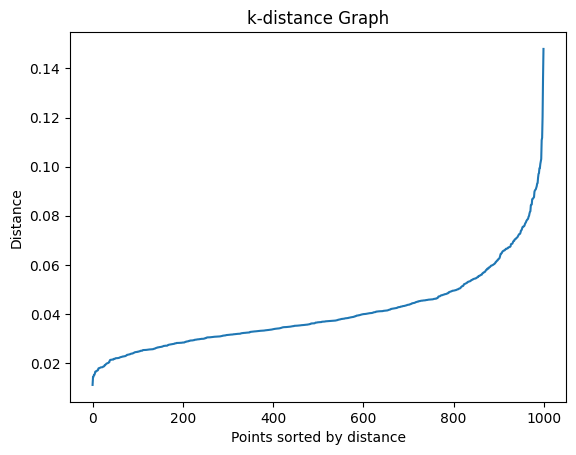

In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

k = 5

neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

k_distances = np.sort(distances[:, k-1])

plt.plot(k_distances)
plt.title("k-distance Graph")
plt.ylabel("Distance")
plt.xlabel("Points sorted by distance")
plt.show()

In [ ]:
for eps in [0.05, 0.06, 0.07, 0.08]:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(X)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    print(f"eps={eps}, clusters={n_clusters}, noise={n_noise}")

eps=0.05, clusters=7, noise=77
eps=0.06, clusters=2, noise=36
eps=0.07, clusters=2, noise=15
eps=0.08, clusters=2, noise=7


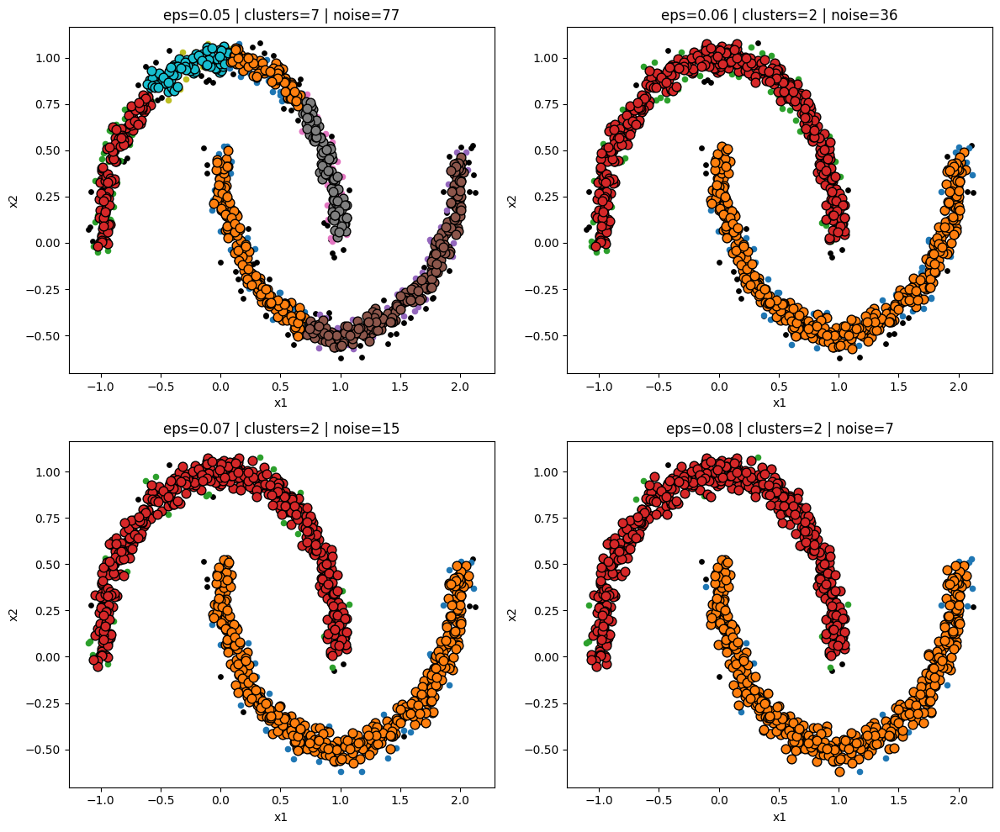

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

def plot_dbscan(ax, X, eps, min_samples=5):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
    labels = db.labels_

    core_mask = np.zeros_like(labels, dtype=bool)
    core_mask[db.core_sample_indices_] = True

    unique_labels = np.unique(labels)

    for label in unique_labels:
        mask = labels == label
        if label == -1:
            ax.scatter(X[mask, 0], X[mask, 1], c="black", s=15, label="Noise")
        else:
            border = mask & ~core_mask
            core = mask & core_mask
            ax.scatter(X[border, 0], X[border, 1], s=20)
            ax.scatter(X[core, 0], X[core, 1], s=60, edgecolors="k")

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = np.sum(labels == -1)

    ax.set_title(f"eps={eps} | clusters={n_clusters} | noise={n_noise}")
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")

eps_list = [0.05, 0.06, 0.07, 0.08]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

for ax, eps in zip(axes, eps_list):
    plot_dbscan(ax, X, eps, min_samples=5)

plt.tight_layout()
plt.show()

In [ ]:
! curl -L -o uber-pickups-in-new-york-city.zip\
  https://www.kaggle.com/api/v1/datasets/download/fivethirtyeight/uber-pickups-in-new-york-city

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  109M  100  109M    0     0   104M      0  0:00:01  0:00:01 --:--:--  104M


In [ ]:
!unzip /content/uber-pickups-in-new-york-city.zip

Archive:  /content/uber-pickups-in-new-york-city.zip
replace Uber-Jan-Feb-FOIL.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: Uber-Jan-Feb-FOIL.csv   
replace other-American_B01362.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-American_B01362.csv  
replace other-Carmel_B00256.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-Carmel_B00256.csv  
replace other-Dial7_B00887.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-Dial7_B00887.csv  
replace other-Diplo_B01196.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-Diplo_B01196.csv  
replace other-FHV-services_jan-aug-2015.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-FHV-services_jan-aug-2015.csv  
replace other-Federal_02216.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-Federal_02216.csv  
replace other-Firstclass_B01536.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: other-Firstclass_B01536.csv  
replace other-Highclas

In [ ]:
import pandas as pd

df = pd.read_csv("/content/uber-raw-data-apr14.csv")

In [ ]:
df

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
564511,4/30/2014 23:22:00,40.7640,-73.9744,B02764
564512,4/30/2014 23:26:00,40.7629,-73.9672,B02764
564513,4/30/2014 23:31:00,40.7443,-73.9889,B02764
564514,4/30/2014 23:32:00,40.6756,-73.9405,B02764


In [ ]:
len(df)

564516

In [ ]:
df_small = df.sample(n=100_000, random_state=42)
print("Sampled rows:", len(df_small))

Sampled rows: 100000


In [ ]:
coords = df_small[["Lat", "Lon"]].dropna().to_numpy()

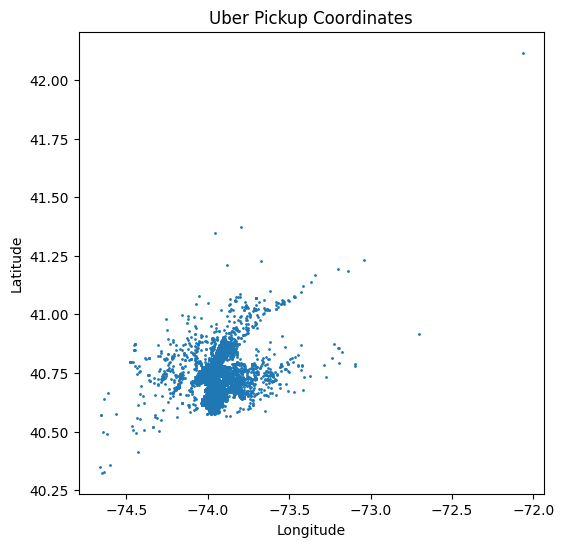

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.scatter(coords[:,1], coords[:,0], s=1)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Uber Pickup Coordinates")
plt.show()

In [ ]:
import folium

m = folium.Map(location=[40.75, -73.98], zoom_start=12)

for lat, lon in coords[:2000]:
    folium.CircleMarker([lat, lon], radius=1).add_to(m)

m

In [ ]:
import numpy as np

In [ ]:
coords_rad = np.radians(coords)

In [ ]:
kms_per_radian = 6371.0088
eps_km = 0.3
eps = eps_km / kms_per_radian

db = DBSCAN(eps=eps, min_samples=30, metric="haversine")
labels = db.fit_predict(coords_rad)

In [ ]:
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = np.sum(labels == -1)

print("clusters:", n_clusters, "noise:", n_noise)

clusters: 23 noise: 4841


In [ ]:
import hdbscan
import numpy as np



clusterer = hdbscan.HDBSCAN(
    min_cluster_size=200,
    min_samples=30,
    metric='haversine'
)

labels = clusterer.fit_predict(coords_rad)

n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = np.sum(labels == -1)

print("clusters:", n_clusters)
print("noise:", n_noise)

clusters: 19
noise: 5360


In [ ]:
clusterer.probabilities_

array([0.61733923, 0.7966433 , 1.        , ..., 1.        , 1.        ,
       0.60930528])

In [ ]:
from sklearn.cluster import DBSCAN
import pandas as pd

def run_dbscan(eps_km_list, min_samples=30):
    out = []
    for eps_km in eps_km_list:
        eps = eps_km / 6371.0088
        labels = DBSCAN(eps=eps, min_samples=min_samples, metric="haversine").fit_predict(coords_rad)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = (labels == -1).sum()
        out.append((eps_km, n_clusters, n_noise / len(labels)))
    return pd.DataFrame(out, columns=["eps_km", "clusters", "noise_frac"])

df_db = run_dbscan([0.1,0.2,0.3,0.4,0.5], min_samples=30)
print(df_db)

   eps_km  clusters  noise_frac
0     0.1        51     0.14115
1     0.2        29     0.07141
2     0.3        23     0.04841
3     0.4        12     0.03570
4     0.5        13     0.02952


In [ ]:
import pandas as pd
import hdbscan

def run_hdbscan(mcs_list, min_samples=30):
    out = []
    for mcs in mcs_list:
        clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs, min_samples=min_samples, metric="haversine")
        labels = clusterer.fit_predict(coords_rad)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = (labels == -1).sum()
        mean_prob = clusterer.probabilities_[labels != -1].mean() if (labels != -1).any() else 0
        out.append((mcs, n_clusters, n_noise / len(labels), mean_prob))
    return pd.DataFrame(out, columns=["min_cluster_size", "clusters", "noise_frac", "mean_prob_in_cluster"])

df_hdb = run_hdbscan([50,100,200,400], min_samples=30)
print(df_hdb)

   min_cluster_size  clusters  noise_frac  mean_prob_in_cluster
0                50       323     0.43991              0.895985
1               100       171     0.45539              0.905873
2               200        19     0.05360              0.968390
3               400         9     0.04991              0.943542


#Hierarchical Clustering

#AgglomerativeClustering

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.datasets import make_moons
from sklearn.cluster import AgglomerativeClustering

from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster import  BisectingKMeans

In [ ]:
X, _ = make_moons(n_samples=600, noise=0.08, random_state=42)

In [ ]:
X.shape

(600, 2)

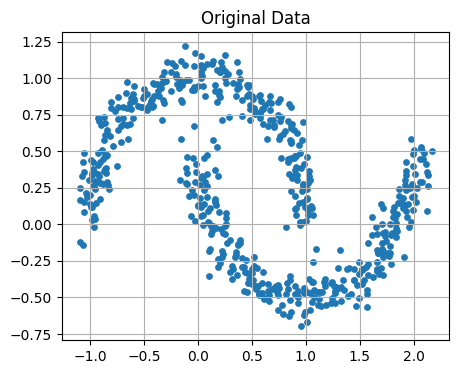

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(X[:,0], X[:,1], s=15)
plt.title("Original Data")
plt.grid(True)
plt.show()

In [ ]:
model = AgglomerativeClustering(
    n_clusters=2,
    linkage="complete"  # complete average ward
)

labels = model.fit_predict(X)

In [ ]:
np.unique(labels)

array([0, 1])

In [ ]:
np.unique(labels, return_counts=True)

(array([0, 1]), array([369, 231]))

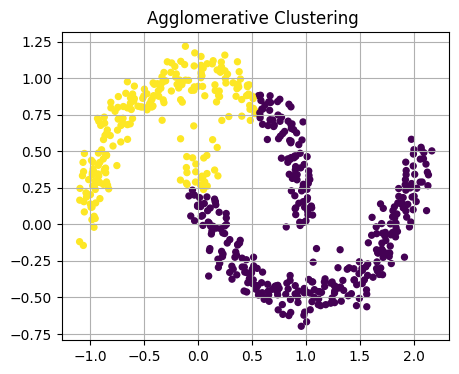

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(X[:,0], X[:,1], c=labels, s=18)
plt.title("Agglomerative Clustering ")
plt.grid(True)
plt.show()


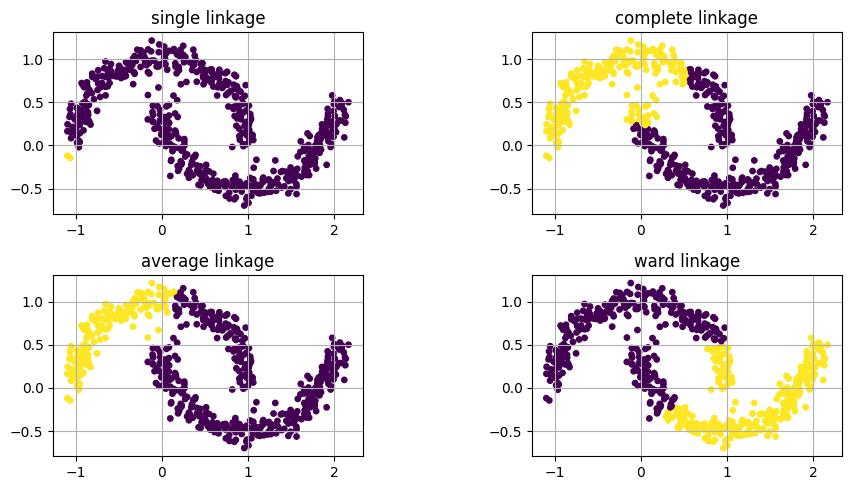

In [ ]:
ax, fig = plt.subplots(2,2, figsize=(10,5))
fig = fig.ravel()
for i, link in enumerate(["single", "complete", "average", "ward"]):
  model = AgglomerativeClustering(
      n_clusters=2,
      linkage=link
  )
  labels = model.fit_predict(X)
  fig[i].scatter(X[:,0], X[:,1], c=labels, s=15)
  fig[i].set_title(f"{link} linkage")
  fig[i].grid(True)
  fig[i].set_aspect("equal")

plt.tight_layout()
plt.show()




In [ ]:
model = AgglomerativeClustering(
    n_clusters=None,
    distance_threshold=0.15,
    linkage="single"
)

labels = model.fit_predict(X)

In [ ]:
np.unique(labels)

array([0, 1, 2, 3])

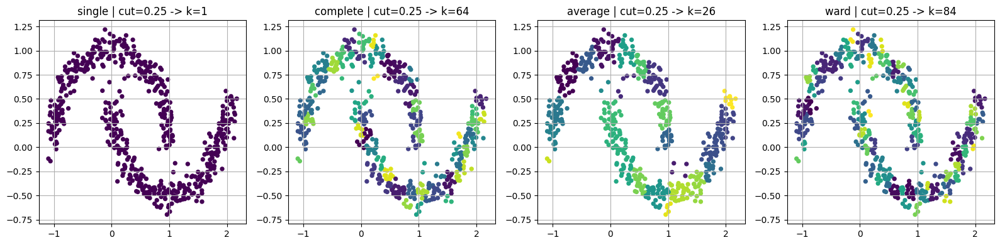

In [ ]:
linkages = ["single", "complete", "average", "ward"]
t = 0.25

plt.figure(figsize=(16,4))
for i, link in enumerate(linkages, 1):
    model = AgglomerativeClustering(
        n_clusters=None,
        distance_threshold=t,
        linkage=link
    )
    labels = model.fit_predict(X)
    k = len(np.unique(labels))

    plt.subplot(1,4,i)
    plt.scatter(X[:,0], X[:,1], c=labels, s=18)
    plt.title(f"{link} | cut={t} -> k={k}")
    plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
method = "ward"  # single, complete, average, ward
Z = linkage(X, method=method, metric="euclidean")

In [ ]:
Z

array([[5.80000000e+01, 3.20000000e+02, 1.64962320e-03, 2.00000000e+00],
       [2.74000000e+02, 4.96000000e+02, 2.78616971e-03, 2.00000000e+00],
       [2.39000000e+02, 5.36000000e+02, 3.02593697e-03, 2.00000000e+00],
       ...,
       [1.19000000e+03, 1.19400000e+03, 1.05455775e+01, 2.71000000e+02],
       [1.19300000e+03, 1.19500000e+03, 1.24560791e+01, 3.29000000e+02],
       [1.19600000e+03, 1.19700000e+03, 2.67002436e+01, 6.00000000e+02]])

In [ ]:
labels = fcluster(Z, t=0.25, criterion="distance")
np.unique(labels)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84],
      dtype=int32)

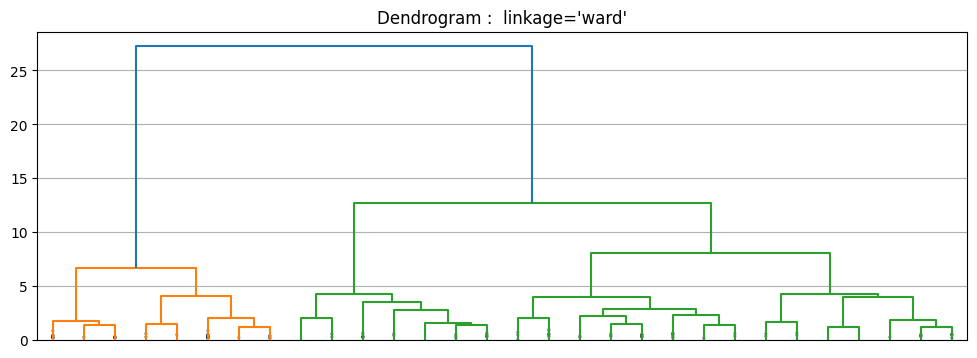

In [ ]:
plt.figure(figsize=(12,4))

dendrogram(
    Z,
    truncate_mode="lastp",
    p=30,
    show_contracted=True,
    no_labels=True
)
plt.title(f"Dendrogram :  linkage='{method}'")
plt.grid(True)
plt.show()

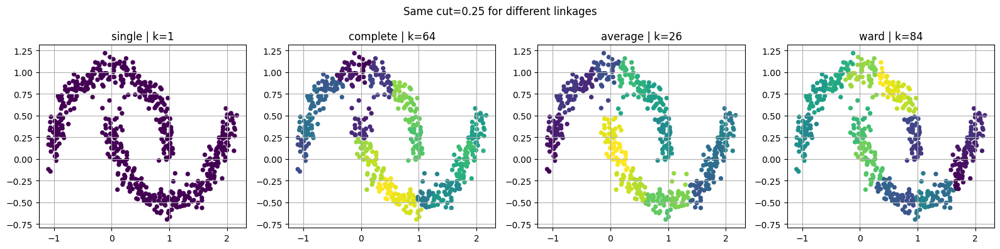

In [ ]:
methods = ["single", "complete", "average", "ward"]
t = 0.25

plt.figure(figsize=(16,4))

for i, m in enumerate(methods, 1):
    Zm = linkage(X, method=m, metric="euclidean")
    labels = fcluster(Zm, t=t, criterion="distance")
    k = len(np.unique(labels))

    plt.subplot(1,4,i)
    plt.scatter(X[:,0], X[:,1], c=labels, s=18)
    plt.title(f"{m} | k={k}")
    plt.grid(True)

plt.suptitle(f"Same cut={t} for different linkages")
plt.tight_layout()
plt.show()

In [ ]:
iris = load_iris()
X = iris.data
feature_names = iris.feature_names

df = pd.DataFrame(X, columns=feature_names)
print(df.shape)
df.head()

(150, 4)


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_scaled.shape

(150, 4)

In [ ]:
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

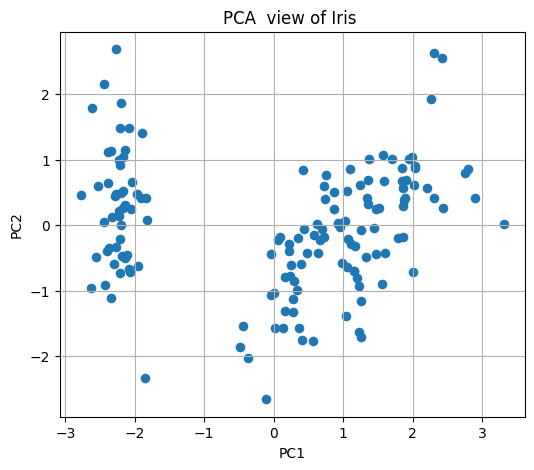

In [ ]:
plt.figure(figsize=(6,5))
plt.scatter(X_pca[:,0], X_pca[:,1], s=35)
plt.title("PCA  view of Iris ")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.show()

In [ ]:
method = "ward"
Z = linkage(X_scaled, method=method)

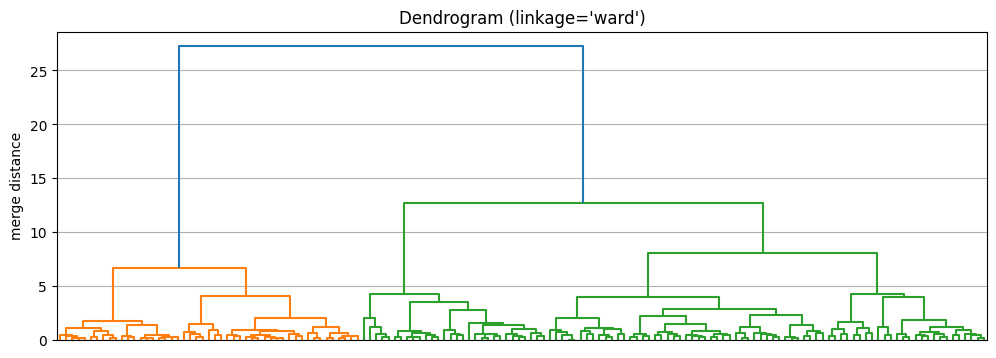

In [ ]:
plt.figure(figsize=(12,4))
dendrogram(Z, no_labels=True)
plt.title(f"Dendrogram (linkage='{method}')")
plt.ylabel("merge distance")
plt.grid(True)
plt.show()

In [ ]:
def clusters_from_cut(Z, t):
    labels = fcluster(Z, t=t, criterion="distance")
    k = len(np.unique(labels))
    return labels, k

In [ ]:
for t in [6, 9, 12, 15]:
    labels, k = clusters_from_cut(Z, t)
    print(f"cut={t} -> k={k}")

cut=6 -> k=5
cut=9 -> k=3
cut=12 -> k=3
cut=15 -> k=2


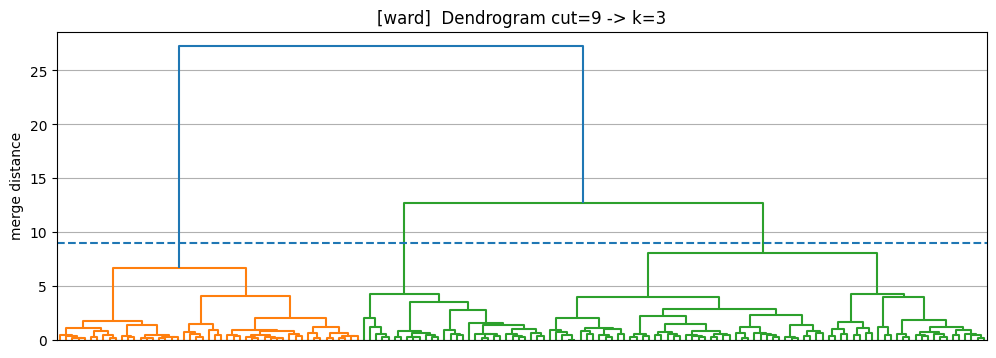

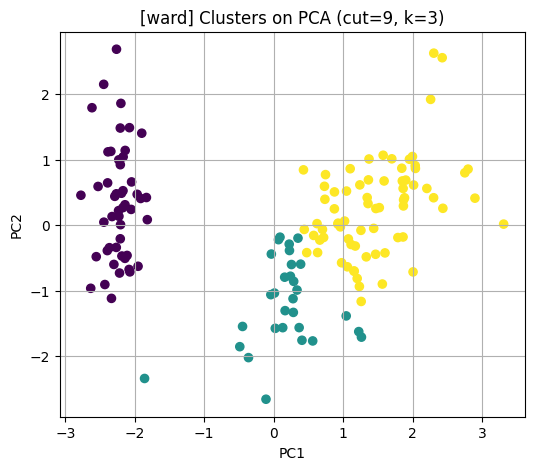

In [ ]:
def show_cut_effect(Z, X_pca, t, title_prefix=""):
    labels, k = clusters_from_cut(Z, t)

    plt.figure(figsize=(12,4))
    dendrogram(Z, no_labels=True)
    plt.axhline(y=t, linestyle="--")
    plt.title(f"{title_prefix} Dendrogram cut={t} -> k={k}")
    plt.ylabel("merge distance")
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(6,5))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, s=35)
    plt.title(f"{title_prefix}Clusters on PCA (cut={t}, k={k})")
    plt.xlabel("PC1"); plt.ylabel("PC2")
    plt.grid(True)
    plt.show()

    return labels


label_t9 = show_cut_effect(Z, X_pca, t=9,  title_prefix=f"[{method}] ")


In [ ]:
label_t9

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 3, 3, 3, 2, 3, 2, 3, 2, 3, 2, 2, 3, 2, 3, 2, 3,
       2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 3, 2, 3, 3, 2,
       2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 2, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], dtype=int32)

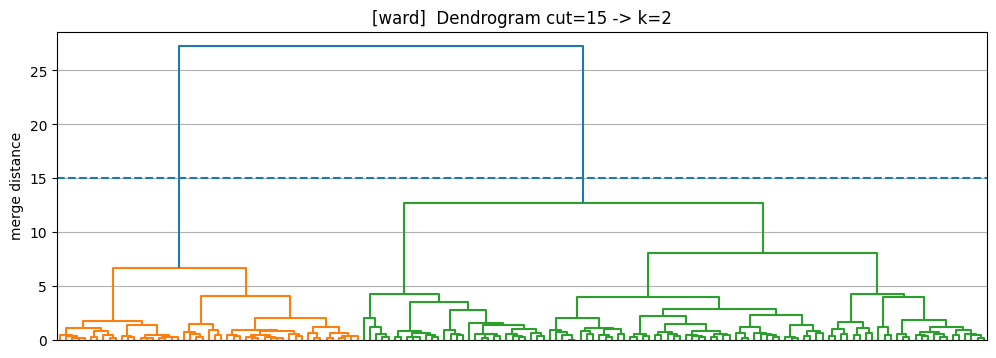

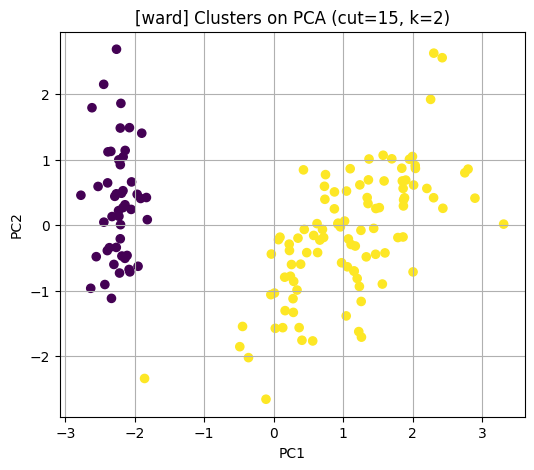

In [ ]:
label_t15 = show_cut_effect(Z, X_pca, t=15, title_prefix=f"[{method}] ")

In [ ]:
label_t15

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)

In [ ]:
last_10 = np.sort(Z[:,2])[-10:]
print(last_10)


[ 3.44191215  3.93266869  3.95076988  4.06134011  4.22703313  4.24348495
  6.60781224  8.00474726 12.63684352 27.24991146]


In [ ]:
diffs = np.diff(last_10)
print("diffs:", diffs)

diffs: [ 0.49075654  0.01810118  0.11057024  0.16569302  0.01645182  2.36432729
  1.39693502  4.63209625 14.61306794]


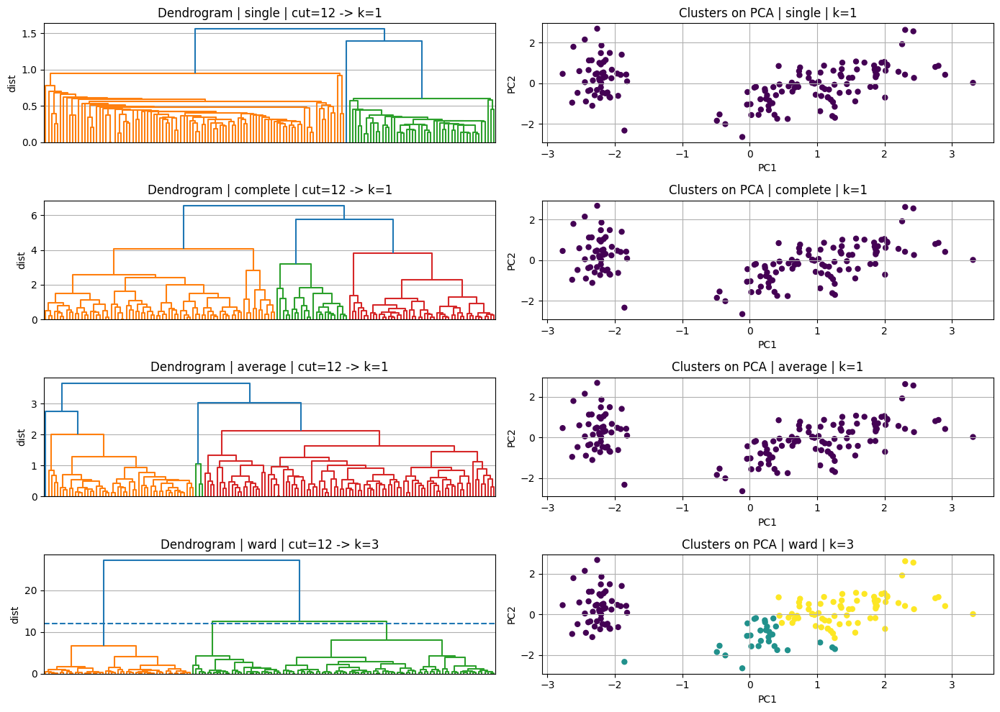

In [ ]:
methods = ["single", "complete", "average", "ward"]

def compare_linkages(X_scaled, X_pca, cut_for_all=12):
    plt.figure(figsize=(14,10))

    for i, m in enumerate(methods, 1):
        Zm = linkage(X_scaled, method=m)
        labels, k = clusters_from_cut(Zm, cut_for_all)


        plt.subplot(4, 2, 2*i-1)
        dendrogram(Zm, no_labels=True)
        plt.axhline(y=cut_for_all, linestyle="--")
        plt.title(f"Dendrogram | {m} | cut={cut_for_all} -> k={k}")
        plt.ylabel("dist")
        plt.grid(True)

        plt.subplot(4, 2, 2*i)
        plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, s=25)
        plt.title(f"Clusters on PCA | {m} | k={k}")
        plt.xlabel("PC1"); plt.ylabel("PC2")
        plt.grid(True)

    plt.tight_layout()
    plt.show()

compare_linkages(X_scaled, X_pca, cut_for_all=12)

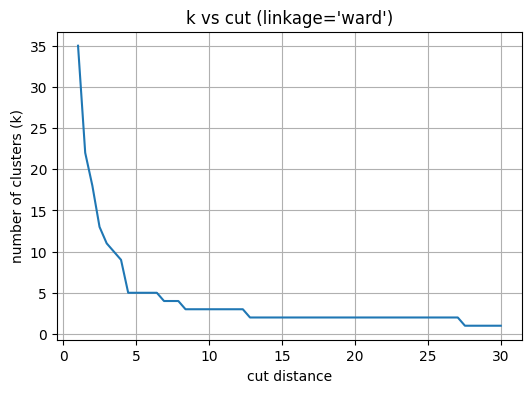

In [ ]:
ts = np.linspace(1, 30, 60)
ks = []
for t in ts:
    _, k = clusters_from_cut(Z, t)
    ks.append(k)

plt.figure(figsize=(6,4))
plt.plot(ts, ks)
plt.title(f"k vs cut (linkage='{method}')")
plt.xlabel("cut distance")
plt.ylabel("number of clusters (k)")
plt.grid(True)
plt.show()

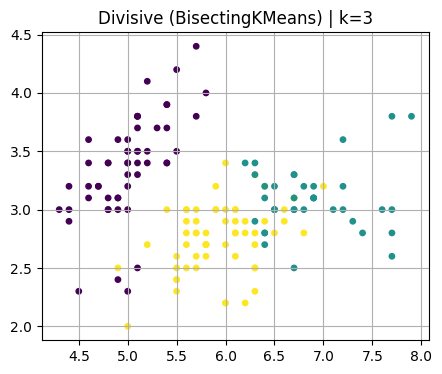

Divisive clusters: 3


In [ ]:
from sklearn.cluster import BisectingKMeans
k = 3

bis = BisectingKMeans(n_clusters=k, random_state=42)
labels_div = bis.fit_predict(X)

plt.figure(figsize=(5,4))
plt.scatter(X[:,0], X[:,1], c=labels_div, s=15)
plt.title(f"Divisive (BisectingKMeans) | k={k}")
plt.grid(True)
plt.show()

print("Divisive clusters:", len(np.unique(labels_div)))

#Project

In [ ]:
from sklearn.datasets import fetch_olivetti_faces

In [ ]:

X, y = fetch_olivetti_faces(return_X_y=True, shuffle=True, random_state=42)

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

In [ ]:

sss = StratifiedShuffleSplit(n_splits=1, random_state=42, test_size=40)

In [ ]:

train_idx, test_idx = next(sss.split(X, y))

In [ ]:

train_idx, test_idx

(array([232,  52, 399, 325,  83,  85, 171, 219, 176,  32, 184, 316, 203,
        257,  28, 139, 279, 317, 247,  37, 315, 251, 350, 353, 209, 223,
        116, 253, 309, 217,  67, 173, 108, 122,  60, 130,  63,  36, 147,
        351, 311,  81, 295, 117,  19, 119, 292,  13, 229, 227,  61,  62,
        194, 392, 198, 204, 150,  90, 168,  15, 157, 161, 174, 346, 220,
        364, 339, 327,  76, 107, 236, 213, 178, 365,  58,  42, 212, 298,
         73, 395, 283, 267, 313, 131, 291,  68, 319, 297,  20,  48, 146,
        274, 285, 338, 301, 289, 337, 132, 136, 231, 394, 224, 166,  47,
        123, 170, 225, 188, 360, 106,  74,  94, 330, 354, 182, 323, 115,
        177, 167, 243,  59, 380,  14,  71, 179, 246, 196, 371, 142, 190,
         89, 368,  93,  55,  80,  84, 248, 393, 299, 205, 284, 103, 186,
        159, 206,   0, 169, 100, 398, 306, 113, 358, 237, 199,  34, 379,
         40, 210,  79,  98,  43, 118,  78, 193, 255, 321, 382, 211, 391,
         49, 377,  23, 152, 105, 386,  44, 140, 265

In [ ]:

X_train, y_train = X[train_idx], y[train_idx]
X_test, y_test = X[test_idx], y[test_idx]

In [ ]:
sss = StratifiedShuffleSplit(n_splits=1, random_state=43, test_size=80)

In [ ]:
train_idx, validation_idx = next(sss.split(X_train, y_train))

In [ ]:

X_train_new, y_train_new = X_train[train_idx], y_train[train_idx]
X_validation, y_validation = X_train[validation_idx], y_train[validation_idx]

In [ ]:

from sklearn.decomposition import PCA

In [ ]:

pca = PCA(n_components=0.99, random_state=42)

In [ ]:

X_train_new_transformed = pca.fit_transform(X_train_new)

In [ ]:

X_validation_new_transformed, X_test_transformed = pca.transform(X_validation),  pca.transform(X_test)

In [ ]:

from sklearn.metrics import silhouette_score

In [ ]:

from sklearn.cluster import KMeans

In [ ]:

sil_scores = [KMeans(n_clusters=i, random_state=42).fit(X_train) for i in range(20, 200, 5)]

In [ ]:

scores_total = [silhouette_score(X, model.predict(X)) for model in sil_scores]
scores_total

[np.float32(0.09499594),
 np.float32(0.10914835),
 np.float32(0.121061),
 np.float32(0.13931203),
 np.float32(0.14061514),
 np.float32(0.14527144),
 np.float32(0.1522973),
 np.float32(0.16451842),
 np.float32(0.16499497),
 np.float32(0.15996352),
 np.float32(0.1708932),
 np.float32(0.17515713),
 np.float32(0.1802945),
 np.float32(0.1837766),
 np.float32(0.18436791),
 np.float32(0.18847422),
 np.float32(0.19096005),
 np.float32(0.19382355),
 np.float32(0.19369018),
 np.float32(0.19562846),
 np.float32(0.19605461),
 np.float32(0.19414559),
 np.float32(0.19209343),
 np.float32(0.191708),
 np.float32(0.19085912),
 np.float32(0.19215935),
 np.float32(0.19076489),
 np.float32(0.19139363),
 np.float32(0.18897027),
 np.float32(0.18780434),
 np.float32(0.18765941),
 np.float32(0.18924552),
 np.float32(0.18890586),
 np.float32(0.18612692),
 np.float32(0.182576),
 np.float32(0.18180119)]

In [ ]:
import numpy as np
np.argmax(scores_total)

np.int64(20)

In [ ]:
best_model = sil_scores[np.argmax(scores_total)]

In [ ]:
sil_scores[np.argmax(scores_total)]

KMeans(n_clusters=120, random_state=42)

In [ ]:
trained_model = best_model.fit(X)

In [ ]:
trained_model.inertia_

5751.83447265625

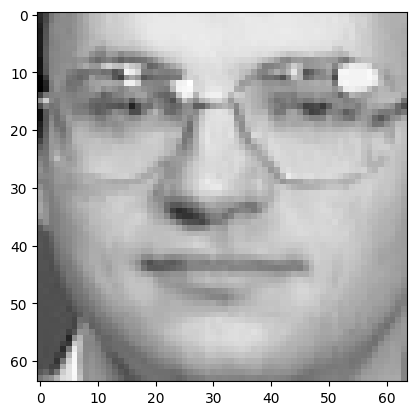

In [ ]:
for image in X_train:
  plt.imshow(image.reshape(64, 64), cmap='gray')

Cluster 0


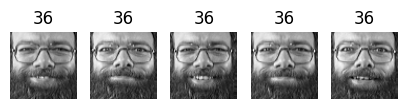

Cluster 1


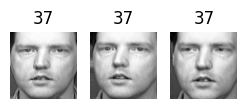

Cluster 2


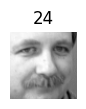

Cluster 3


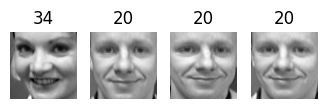

Cluster 4


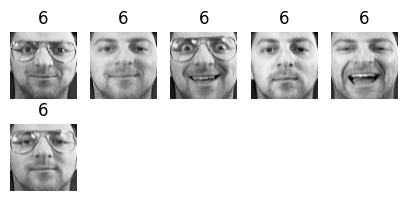

Cluster 5


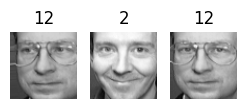

Cluster 6


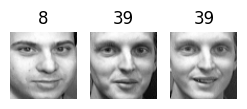

Cluster 7


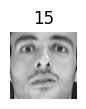

Cluster 8


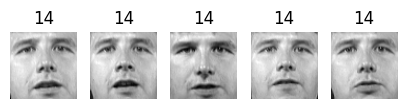

Cluster 9


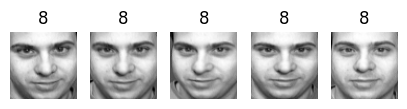

Cluster 10


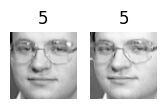

Cluster 11


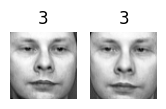

Cluster 12


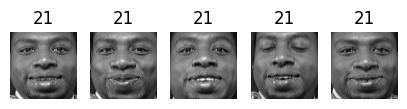

Cluster 13


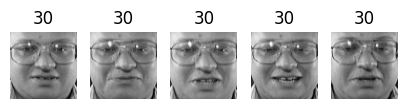

Cluster 14


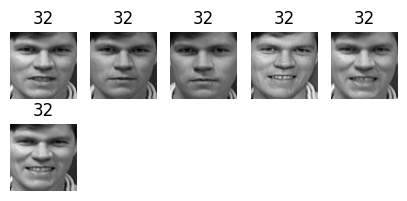

Cluster 15


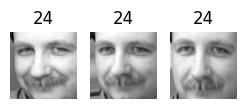

Cluster 16


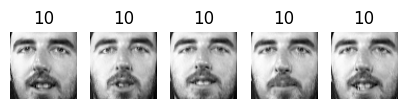

Cluster 17


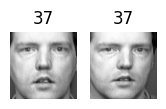

Cluster 18


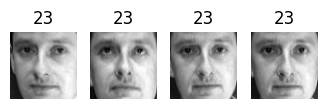

Cluster 19


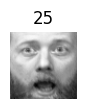

Cluster 20


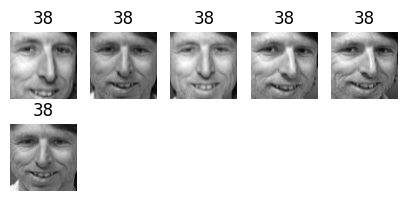

Cluster 21


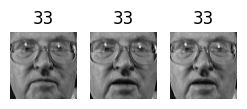

Cluster 22


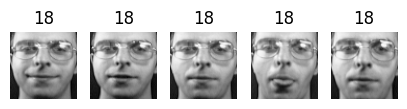

Cluster 23


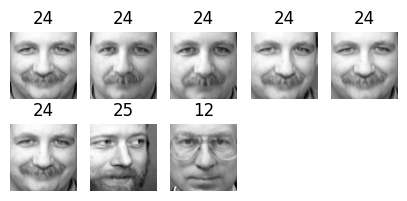

Cluster 24


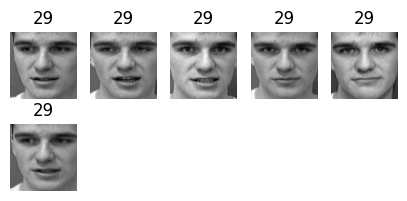

Cluster 25


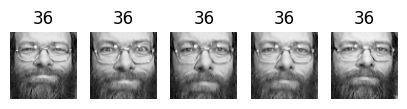

Cluster 26


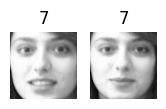

Cluster 27


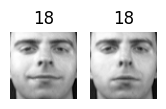

Cluster 28


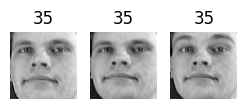

Cluster 29


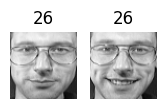

Cluster 30


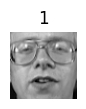

Cluster 31


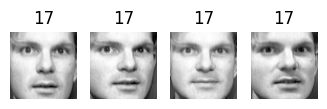

Cluster 32


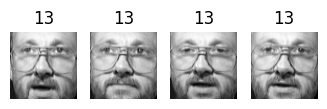

Cluster 33


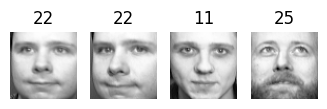

Cluster 34


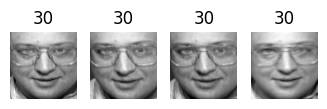

Cluster 35


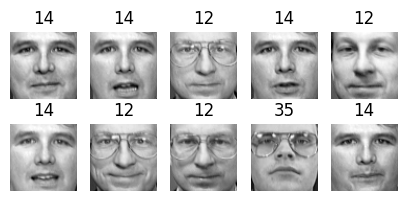

Cluster 36


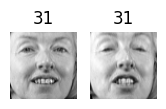

Cluster 37


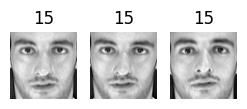

Cluster 38


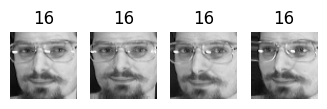

Cluster 39


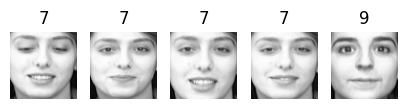

Cluster 40


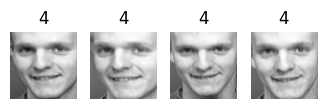

Cluster 41


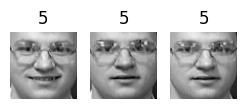

Cluster 42


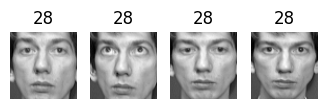

Cluster 43


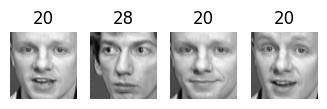

Cluster 44


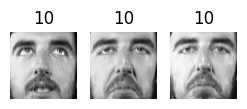

Cluster 45


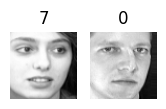

Cluster 46


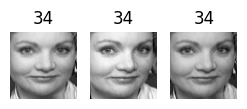

Cluster 47


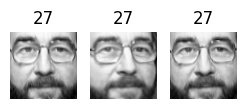

Cluster 48


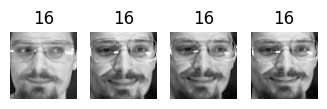

Cluster 49


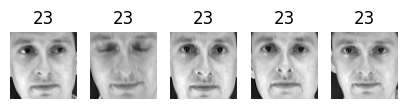

Cluster 50


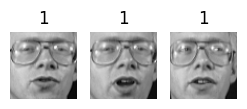

Cluster 51


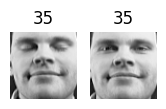

Cluster 52


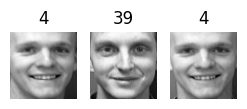

Cluster 53


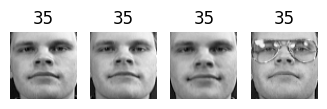

Cluster 54


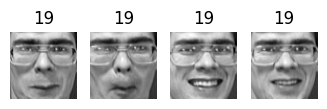

Cluster 55


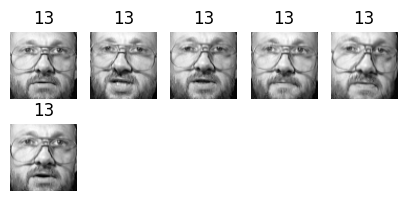

Cluster 56


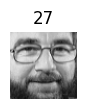

Cluster 57


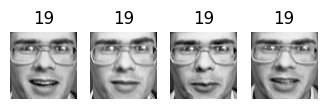

Cluster 58


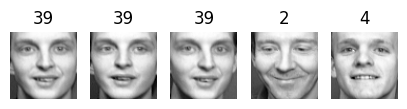

Cluster 59


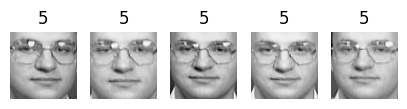

Cluster 60


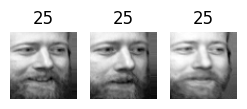

Cluster 61


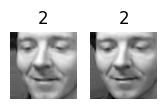

Cluster 62


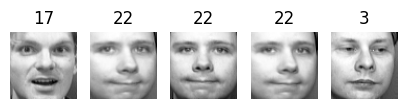

Cluster 63


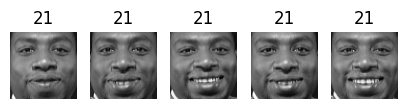

Cluster 64


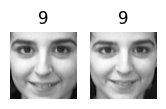

Cluster 65


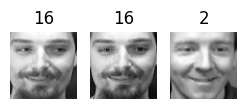

Cluster 66


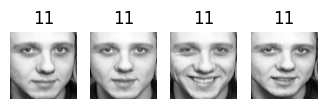

Cluster 67


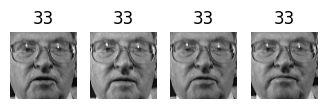

Cluster 68


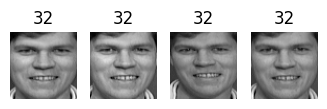

Cluster 69


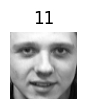

Cluster 70


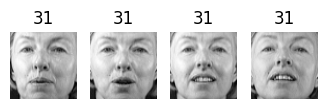

Cluster 71


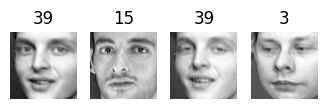

Cluster 72


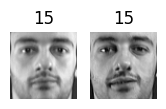

Cluster 73


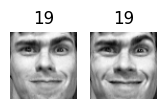

Cluster 74


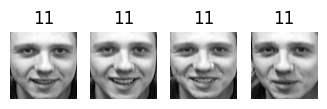

Cluster 75


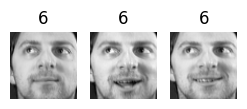

Cluster 76


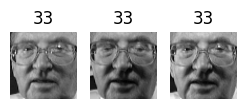

Cluster 77


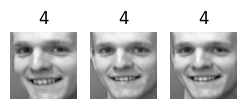

Cluster 78


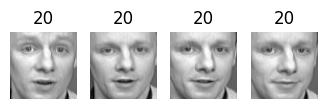

Cluster 79


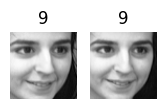

Cluster 80


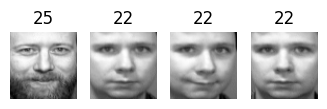

Cluster 81


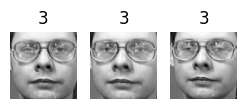

Cluster 82


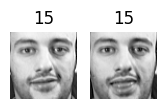

Cluster 83


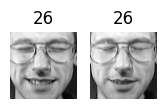

Cluster 84


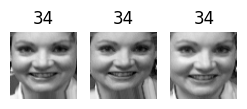

Cluster 85


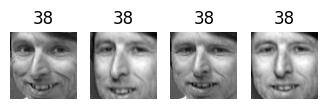

Cluster 86


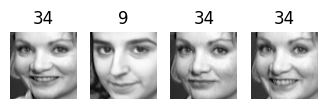

Cluster 87


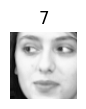

Cluster 88


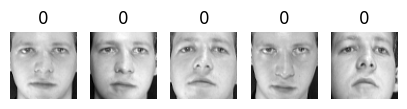

Cluster 89


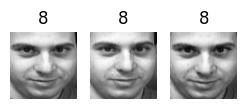

Cluster 90


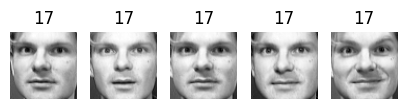

Cluster 91


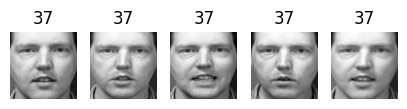

Cluster 92


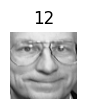

Cluster 93


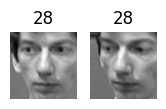

Cluster 94


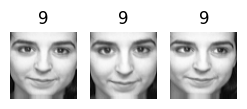

Cluster 95


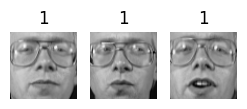

Cluster 96


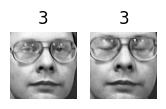

Cluster 97


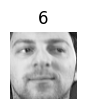

Cluster 98


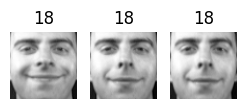

Cluster 99


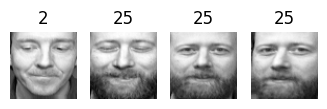

Cluster 100


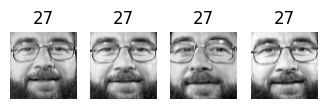

Cluster 101


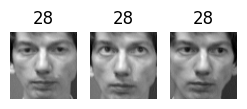

Cluster 102


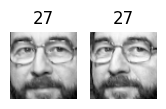

Cluster 103


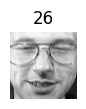

Cluster 104


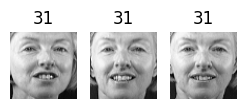

Cluster 105


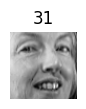

Cluster 106


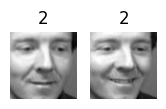

Cluster 107


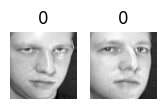

Cluster 108


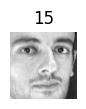

Cluster 109


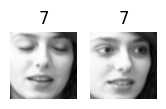

Cluster 110


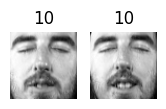

Cluster 111


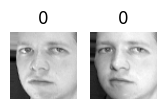

Cluster 112


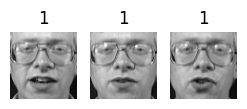

Cluster 113


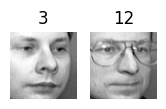

Cluster 114


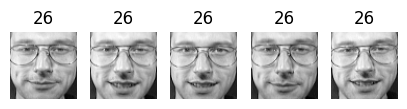

Cluster 115


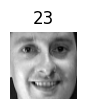

Cluster 116


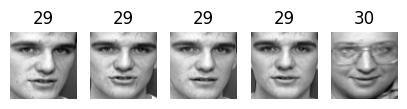

Cluster 117


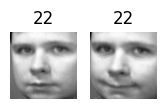

Cluster 118


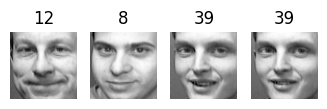

Cluster 119


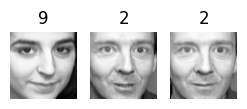

In [ ]:
def plot_faces(faces, labels, n_cols=5):
  faces = faces.reshape(-1, 64, 64)
  n_rows = (len(faces) - 1) // n_cols + 1
  plt.figure(figsize=(n_cols, n_rows * 1.1))
  for index, (face, label) in enumerate(zip(faces, labels)):
    plt.subplot(n_rows, n_cols, index + 1)
    plt.imshow(face, cmap='gray')
    plt.axis('off')
    plt.title(label)
  plt.show()

for cluster_id in np.unique(best_model.labels_):
  print("Cluster", cluster_id)
  in_cluster = best_model.labels_==cluster_id
  faces = X[in_cluster]
  labels = y[in_cluster]
  plot_faces(faces, labels)